In [35]:
import pandas as pd
import requests
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [14]:
# Run it one time
url = "https://huggingface.co/api/datasets/ekacare/NidaanKosha-100k-V1.0/parquet/default/train/0.parquet"
response = requests.get(url)

# Save it to a file or handle it in-memory
with open("0.parquet", "wb") as f:
    f.write(response.content)
    
    
url2 = "https://huggingface.co/api/datasets/ekacare/NidaanKosha-100k-V1.0/parquet/default/train/1.parquet"
response2 = requests.get(url2)

# Save it to a file or handle it in-memory
with open("1.parquet", "wb") as f:
    f.write(response2.content)

In [2]:
# Load the parquet file using pandas
df = pd.read_parquet("0.parquet")
print(df.head())  # Display the first few rows of the dataframe


                        document_id  age  gender  \
0  a1ce7f03fca11a7351927f5d6d635552   72  female   
1  a1ce7f03fca11a7351927f5d6d635552   72  female   
2  a1ce7f03fca11a7351927f5d6d635552   72  female   
3  a1ce7f03fca11a7351927f5d6d635552   72  female   
4  a1ce7f03fca11a7351927f5d6d635552   72  female   

                            test_name display_ranges     value   unit  \
0            % TRANSFERRIN SATURATION           None   25.4100      %   
1                                IRON           None   98.6000  ug/dl   
2  TOTAL IRON BINDING CAPACITY (TIBC)           None  388.0000  ug/dl   
3         ALANINE TRANSAMINASE (SGPT)         < 34.0   29.4600    U/I   
4                       ALBUMIN SERUM      3.2 - 4.8    4.4400  gm/dl   

  specimen   loinc  
0    blood  2502-3  
1     None  2498-4  
2    blood  2500-7  
3    blood  1742-6  
4    blood  1751-7  


In [3]:

# Load the parquet file using pandas
df2 = pd.read_parquet("1.parquet")
print(df.head())  # Display the first few rows of the dataframe


                        document_id  age  gender  \
0  a1ce7f03fca11a7351927f5d6d635552   72  female   
1  a1ce7f03fca11a7351927f5d6d635552   72  female   
2  a1ce7f03fca11a7351927f5d6d635552   72  female   
3  a1ce7f03fca11a7351927f5d6d635552   72  female   
4  a1ce7f03fca11a7351927f5d6d635552   72  female   

                            test_name display_ranges     value   unit  \
0            % TRANSFERRIN SATURATION           None   25.4100      %   
1                                IRON           None   98.6000  ug/dl   
2  TOTAL IRON BINDING CAPACITY (TIBC)           None  388.0000  ug/dl   
3         ALANINE TRANSAMINASE (SGPT)         < 34.0   29.4600    U/I   
4                       ALBUMIN SERUM      3.2 - 4.8    4.4400  gm/dl   

  specimen   loinc  
0    blood  2502-3  
1     None  2498-4  
2    blood  2500-7  
3    blood  1742-6  
4    blood  1751-7  


In [4]:
data = pd.concat([df, df2])

In [5]:
data

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc
0,a1ce7f03fca11a7351927f5d6d635552,72,female,% TRANSFERRIN SATURATION,None,25.4100,%,blood,2502-3
1,a1ce7f03fca11a7351927f5d6d635552,72,female,IRON,None,98.6000,ug/dl,None,2498-4
2,a1ce7f03fca11a7351927f5d6d635552,72,female,TOTAL IRON BINDING CAPACITY (TIBC),None,388.0000,ug/dl,blood,2500-7
3,a1ce7f03fca11a7351927f5d6d635552,72,female,ALANINE TRANSAMINASE (SGPT),< 34.0,29.4600,U/I,blood,1742-6
4,a1ce7f03fca11a7351927f5d6d635552,72,female,ALBUMIN SERUM,3.2 - 4.8,4.4400,gm/dl,blood,1751-7
...,...,...,...,...,...,...,...,...,...
3422147,2f559a8f449f646825c469bb2c0b4f40,33,male,Insulin- Postprandial,None,68.6100,uU/mL,blood,None
3422148,2f559a8f449f646825c469bb2c0b4f40,33,male,Thyroid Stimulating Hormone Ultra,0.55 - 4.78,8.1290,ulU/ml,blood,3016-3
3422149,2f559a8f449f646825c469bb2c0b4f40,33,male,Vitamin D2,None,below 3.55,ng/mL,blood,2236-8
3422150,2f559a8f449f646825c469bb2c0b4f40,33,male,vitamin D total,severe deficiency: < 10\nmild-moderate deficie...,10.8000,ng/mL,blood,62292-8


In [6]:
# make all the test names in lower case

data['gender'] = data['gender'].str.lower()
data['test_name'] = data['test_name'].str.lower()
data['specimen'] = data['specimen'].str.lower()

In [26]:

def check_in_range(display_range, value):
    display_range = str(display_range).lower().replace("mg/dl", "").replace("mg / dl", "").strip()
    value = float(value)

    # Try matching any range like "200-239"
    range_matches = re.findall(r'(\d+\.?\d*)\s*[-–]\s*(\d+\.?\d*)', display_range)
    for lower_str, upper_str in range_matches:
        lower, upper = float(lower_str), float(upper_str)
        if lower <= value <= upper:
            return True

    # Try matching inequalities like "> 239", "< 200"
    inequality_matches = re.findall(r'(>|<)\s*(\d+\.?\d*)', display_range)
    for operator, number in inequality_matches:
        number = float(number)
        if operator == '>' and value > number:
            return True
        elif operator == '<' and value < number:
            return True

    # Try matching things like "desirable <200" or "high >239"
    labeled_matches = re.findall(r'[a-z\s]*[:]?[\s]*(<|>)\s*(\d+\.?\d*)', display_range)
    for op, num in labeled_matches:
        num = float(num)
        if op == '<' and value < num:
            return True
        elif op == '>' and value > num:
            return True

    return False

# Example usage:

data['value'] = pd.to_numeric(data['value'], errors='coerce')

# Assuming df is your dataframe and it has 'display_ranges' and 'value' columns
data['value'] = data['value'].astype(float)
data['in_range'] = data.apply(lambda row: check_in_range(row['display_ranges'], row['value']), axis=1)


In [27]:
data.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range
0,a1ce7f03fca11a7351927f5d6d635552,72,female,% transferrin saturation,None,25.41,%,blood,2502-3,>60 yrs,blood,False
1,a1ce7f03fca11a7351927f5d6d635552,72,female,iron,None,98.60,ug/dl,None,2498-4,>60 yrs,blood,False
2,a1ce7f03fca11a7351927f5d6d635552,72,female,total iron binding capacity (tibc),None,388.00,ug/dl,blood,2500-7,>60 yrs,blood,False
3,a1ce7f03fca11a7351927f5d6d635552,72,female,alanine transaminase (sgpt),< 34.0,29.46,U/I,blood,1742-6,>60 yrs,blood,True
4,a1ce7f03fca11a7351927f5d6d635552,72,female,albumin serum,3.2 - 4.8,4.44,gm/dl,blood,1751-7,>60 yrs,blood,True


In [8]:
data['age'].max()

105

### Insights for Cholesterol, Diabetes, kidney and fatty liver, Cardiovascular health

In [9]:
# group the age into categories

def categorize_age(age):
    if age <= 12:
        return '<13 yrs'
    elif 13 <= age <= 21:
        return '13-20 yrs'
    elif 21 <= age <= 40:
        return '21-40yrs'
    elif 41 <= age <= 60:
        return '41-60yrs'
    elif age >= 61:
        return '>60 yrs'
    
data['age_group'] = data['age'].apply(lambda x: categorize_age(x))

In [10]:
data.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group
0,a1ce7f03fca11a7351927f5d6d635552,72,female,% transferrin saturation,None,25.4100,%,blood,2502-3,>60 yrs
1,a1ce7f03fca11a7351927f5d6d635552,72,female,iron,None,98.6000,ug/dl,None,2498-4,>60 yrs
2,a1ce7f03fca11a7351927f5d6d635552,72,female,total iron binding capacity (tibc),None,388.0000,ug/dl,blood,2500-7,>60 yrs
3,a1ce7f03fca11a7351927f5d6d635552,72,female,alanine transaminase (sgpt),< 34.0,29.4600,U/I,blood,1742-6,>60 yrs
4,a1ce7f03fca11a7351927f5d6d635552,72,female,albumin serum,3.2 - 4.8,4.4400,gm/dl,blood,1751-7,>60 yrs


In [11]:
most_common_specimen = (
    data.groupby(['loinc', 'specimen'])
    .size()
    .reset_index(name='count')
    .sort_values(['loinc', 'count'], ascending=[True, False])
    .drop_duplicates(subset='loinc')
    .rename(columns={'specimen': 'max_specimen'})
)

data = data.merge(most_common_specimen[['loinc', 'max_specimen']], on='loinc', how='left')


In [12]:
data.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen
0,a1ce7f03fca11a7351927f5d6d635552,72,female,% transferrin saturation,None,25.4100,%,blood,2502-3,>60 yrs,blood
1,a1ce7f03fca11a7351927f5d6d635552,72,female,iron,None,98.6000,ug/dl,None,2498-4,>60 yrs,blood
2,a1ce7f03fca11a7351927f5d6d635552,72,female,total iron binding capacity (tibc),None,388.0000,ug/dl,blood,2500-7,>60 yrs,blood
3,a1ce7f03fca11a7351927f5d6d635552,72,female,alanine transaminase (sgpt),< 34.0,29.4600,U/I,blood,1742-6,>60 yrs,blood
4,a1ce7f03fca11a7351927f5d6d635552,72,female,albumin serum,3.2 - 4.8,4.4400,gm/dl,blood,1751-7,>60 yrs,blood


### Distribution by Age and Gender

In [13]:
data_age_gender = data[['document_id', 'age','gender','age_group']].drop_duplicates()
data_age_gender.head()

,document_id,age,gender,age_group
0,a1ce7f03fca11a7351927f5d6d635552,72,female,>60 yrs
59,7cb374e4e2b825c5af8206157026b16f,40,male,21-40yrs
107,fb1e52cde47cc795f457196c6ffaa52b,55,male,41-60yrs
194,75f7a1c823a5229c96cd3eb0d717f059,55,female,41-60yrs
313,518edc22415cb7ef8b9fd1a037245208,78,female,>60 yrs


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


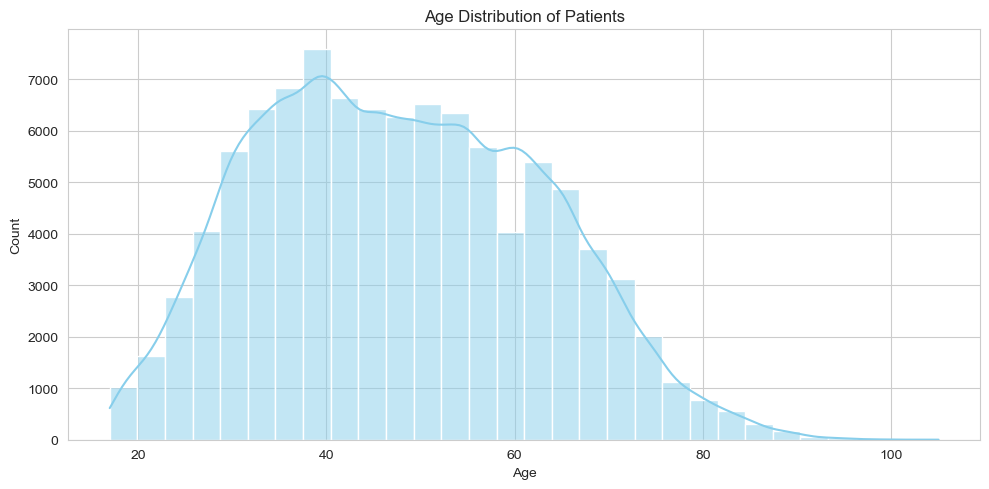

In [14]:
## Distribution by Age
sns.set_style("whitegrid")
plt.figure(figsize=(10, 5))
sns.histplot(data=data_age_gender, x='age', bins=30, kde=True, color='skyblue')
plt.title('Age Distribution of Patients')
plt.xlabel('Age')
plt.ylabel('Count')
plt.grid(True)
plt.tight_layout()
plt.show()

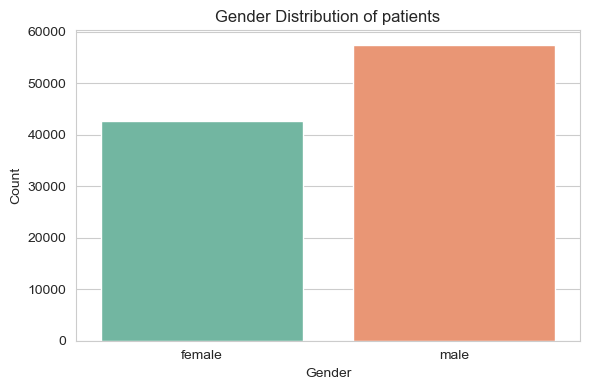

In [15]:
## Gender distribution of pagients

plt.figure(figsize=(6, 4))
sns.countplot(data=data_age_gender, x='gender', palette='Set2')
plt.title('Gender Distribution of patients')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

In [16]:
data.groupby(['gender'])['document_id'].nunique()

gender
female    42654
male      57346
Name: document_id, dtype: int64

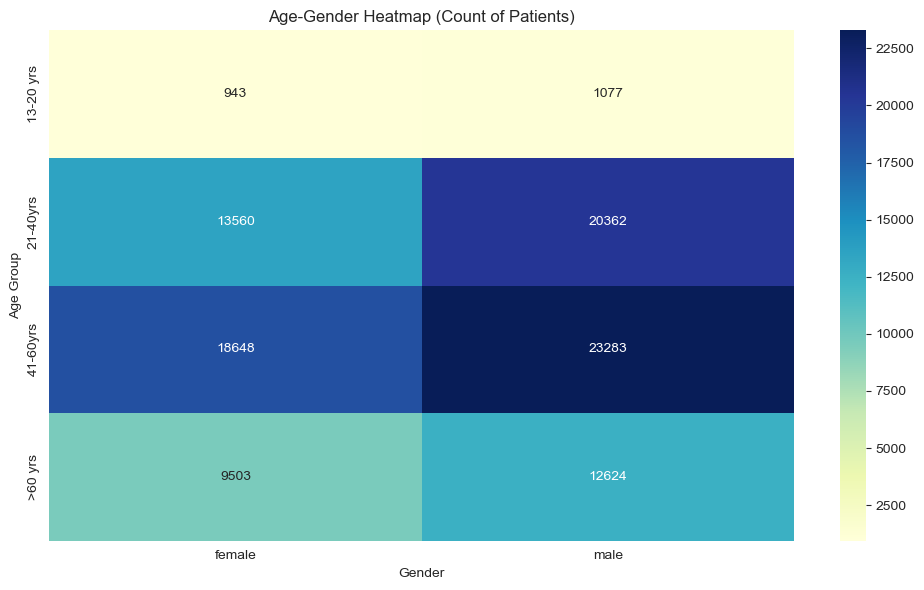

In [17]:
# Count of patients per age group

heatmap_data = data_age_gender.pivot_table(index='age_group', columns='gender', values='document_id', aggfunc='count', fill_value=0)
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Age-Gender Heatmap (Count of Patients)')
plt.xlabel('Gender')
plt.ylabel('Age Group')
plt.tight_layout()
plt.show()

### Cholesterol

In [18]:
li = data[data['test_name'].str.contains('cholesterol', case=False, na=False)]['loinc'].unique()
li

array(['2085-9', '2089-1', '43396-1', '9830-1', '2093-3', '2091-7', None,
       '11054-4', '90364-1', '16616-5', '44733-4', '14647-2', '14646-4',
       '22748-8', '2161-8', '70204-3', '66126-4'], dtype=object)

In [19]:
data[data['loinc'].isin(['2085-9', '2089-1', '2093-3', '2091-7', '22748-8', '14647-2', '14646-4', '70204-3', '66126-4'])]

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen
14,a1ce7f03fca11a7351927f5d6d635552,72,female,hdl cholesterol direct,35.0 - 80.0,73.0000,mg/dl,blood,2085-9,>60 yrs,blood
16,a1ce7f03fca11a7351927f5d6d635552,72,female,ldl cholesterol direct,85.0 - 130.0,64.0000,mg/dl,blood,2089-1,>60 yrs,blood
19,a1ce7f03fca11a7351927f5d6d635552,72,female,total cholesterol,125.0 - 200.0,174.0000,mg/dl,blood,2093-3,>60 yrs,blood
21,a1ce7f03fca11a7351927f5d6d635552,72,female,vldl cholesterol,5.0 - 40.0,27.3900,mg/dl,blood,2091-7,>60 yrs,blood
82,7cb374e4e2b825c5af8206157026b16f,40,male,hdl cholesterol-direct,40.0 - 60.0,46.0700,mg/dL,blood,2085-9,21-40yrs,blood
...,...,...,...,...,...,...,...,...,...,...,...
6844237,8a35f22799da3e136e6bf908b880d627,43,female,vldl cholesterol (calculated),6.0 - 38.0,39.4000,mg/dL,blood,2091-7,41-60yrs,blood
6844270,2f559a8f449f646825c469bb2c0b4f40,33,male,cholesterol total,"desirable <200,\nborderline high 200-239,\nhig...",188.0000,mg/dL,blood,2093-3,21-40yrs,blood
6844273,2f559a8f449f646825c469bb2c0b4f40,33,male,cholesterol hdl,undesirable/high risk\n<=40\ndesirable/low\nri...,33.0000,mg/dL,blood,2085-9,21-40yrs,blood
6844274,2f559a8f449f646825c469bb2c0b4f40,33,male,cholesterol ldl,desirable: <100\nabove desirable: 100\n129\nbo...,118.0000,mg/dL,blood,2089-1,21-40yrs,blood


In [20]:
loinc_dict = {
    '2085-9': 'Cholesterol in HDL [Mass/volume] in Serum or Plasma',
    '2089-1': 'Cholesterol in LDL [Mass/volume] in Serum or Plasma',
    '43396-1': 'Cholesterol non HDL [Mass/volume] in Serum or Plasma',
    '9830-1': 'Cholesterol.total/Cholesterol in HDL [Mass Ratio] in Serum or Plasma',
    '2093-3': 'Cholesterol [Mass/volume] in Serum or Plasma',
    '2091-7': 'Cholesterol [Mass/volume] in Serum or Plasma',
    '11054-4': 'Cholesterol in LDL/Cholesterol in HDL [Mass Ratio] in Serum or Plasma',
    '90364-1': 'Cholesterol.in LDL.small dense [Mass/volume] in Serum or Plasma',
    '16616-5': 'Cholesterol in HDL/Cholesterol in LDL [Mass Ratio] in Serum or Plasma',
    '44733-4': 'Cholesterol in HDL [Mass/volume] in Serum or Plasma',
    '14647-2': 'Cholesterol [Moles/volume] in Serum or Plasma',
    '14646-4': 'Cholesterol in HDL [Moles/volume] in Serum or Plasma',
    '22748-8': 'Cholesterol in LDL [Moles/volume] in Serum or Plasma',
    '70204-3': 'Cholesterol in LDL [Mass/volume] in Serum or Plasma',
    '66126-4': 'Cholesterol in LDL [Mass/volume] in Serum or Plasma',
    None: 'Unknown or missing LOINC code'
}
total_choles = ['2093-3', '14647-2']
bad_choles = ['2089-1', '43396-1', '2091-7', '90364-1', '22748-8', '70204-3', '66126-4']
good_choles = ['2085-9', '14646-4']

ratio = ['9830-1', '11054-4', '16616-5', '44733-4']

In [29]:
data_subset = data[(~data['value'].isna())&(~data['display_ranges'].isna())]


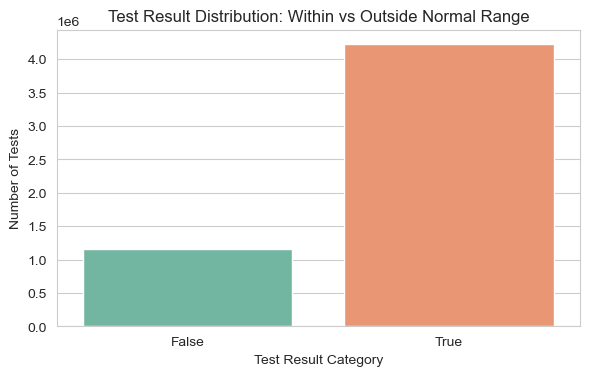

In [30]:
plt.figure(figsize=(6, 4))
sns.countplot(data=data_subset, x='in_range', palette='Set2')
plt.title('Test Result Distribution: Within vs Outside Normal Range')
plt.xlabel('Test Result Category')
plt.ylabel('Number of Tests')
plt.tight_layout()
plt.show()


In [31]:
data_triglycerides = data[data['loinc']=='2571-8']

In [32]:
data_triglycerides['unit'] = data_triglycerides['unit'].str.lower()

# Clean the list and fix the "mg / dl" format
data_triglycerides['unit'] = [' '.join(item.strip().split()) for item in data_triglycerides['unit']]

# Assuming your DataFrame is named data_total
data_triglycerides['unit'] = data_triglycerides['unit'].apply(lambda item: item
                                              .replace(' / ', '/')
                                              .replace('.', '')
                                              .replace(' ', '')
                                              .replace('mgdl', 'mg/dl')
                                              .replace('mg\\dl', 'mg/dl')
                                             .replace('mg/di', 'mg/dl')
                                             .replace('mgs/dl', 'mg/dl')
                                             .replace('mgdi', 'mg/dl')
                                             .replace('[mg/dl]', 'mg/dl')
                                             .replace('mg%)', 'mg%')
                                             .replace('mg%]', 'mg%')
                                             .replace('mg/dl)', 'mg/dl')
                                                             .replace('mg)dl', 'mg/dl')
                                                             .replace('mg(dl', 'mg/dl'))  # Add more replaces as needed


# data_total['unit'] = data_total['unit'].str.lower()

# Print the cleaned data
print(data_triglycerides['unit'].unique())

['mg/dl' 'mg%' 'g/dl' 'gm/dl' 'ng/ml' 'mg/l' 'mg/ml']


/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/2402282544.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_triglycerides['unit'] = data_triglycerides['unit'].str.lower()
/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/2402282544.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_triglycerides['unit'] = [' '.join(item.strip().split()) for item in data_triglycerides['unit']]
/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/2402282544.py:7: SettingW

In [33]:
conversion_factors = {
    'mg/dl': 1,
    'mg%': 1,
    'gm/dl': 1000,
    'g/dl': 1000,
    'ng/ml': 0.0001,
    'mg/l': 0.1,
    'mg/ml': 100
}

# Function to convert values to mg/dl
def convert_to_mg_dl(row):
    return row['value'] * conversion_factors[row['unit']]


# Apply conversion
data_triglycerides['value'] = data_triglycerides[['value', 'unit']].apply(convert_to_mg_dl, axis=1)

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/1530552621.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_triglycerides['value'] = data_triglycerides[['value', 'unit']].apply(convert_to_mg_dl, axis=1)


In [36]:
px.box(data_triglycerides['value'])

In [37]:
data_triglycerides = data_triglycerides[data_triglycerides['value']<400]

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



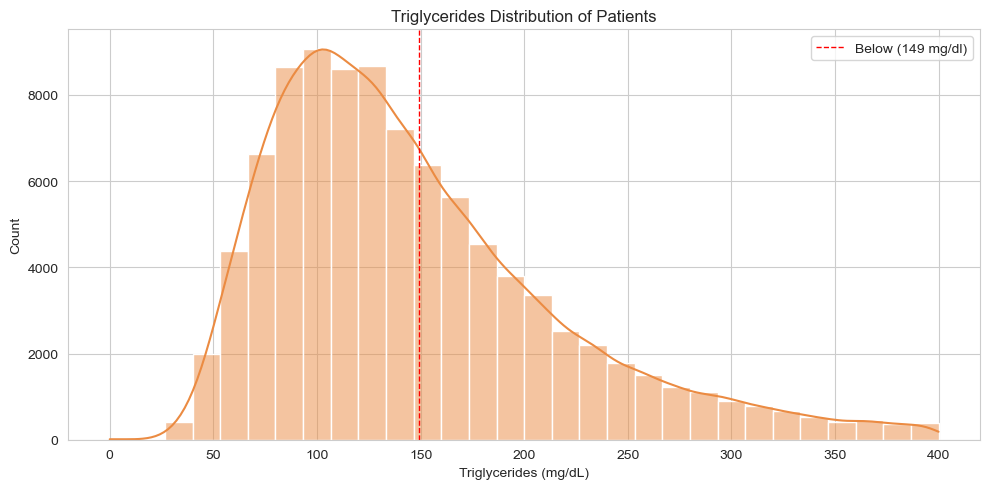

In [38]:
# Remove the outliers

sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))
sns.histplot(data=data_triglycerides, x='value', bins=30, kde=True, color='#eb8b42')
plt.axvline(x=149, color='red', linestyle='--', linewidth=1, label='Below (149 mg/dl)')
# plt.axvline(x=200, color='red', linestyle='--', linewidth=1, label='Upper Limit (200)')
plt.title('Triglycerides Distribution of Patients')
plt.xlabel('Triglycerides (mg/dL)')
plt.ylabel('Count')
# plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



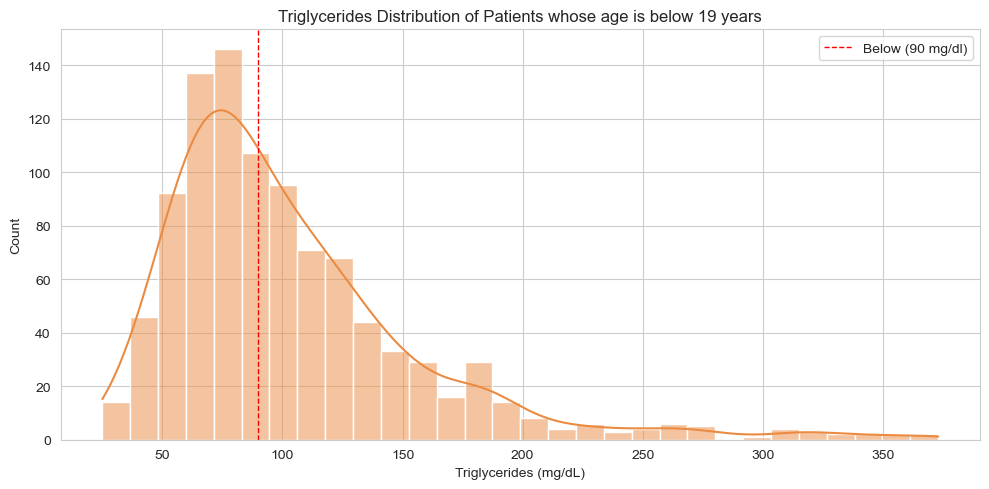

In [39]:
## Distribution by age

# < 19 :  below 170
# 20 and older : 125 to 200


data_triglycerides_below_19 = data_triglycerides[data_triglycerides['age']<=19]
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))
sns.histplot(data=data_triglycerides_below_19, x='value', bins=30, kde=True, color='#eb8b42')
plt.axvline(x=90, color='red', linestyle='--', linewidth=1, label='Below (90 mg/dl)')
# plt.axvline(x=170, color='red', linestyle='--', linewidth=1, label='Upper Limit (200)')
plt.title('Triglycerides Distribution of Patients whose age is below 19 years')
plt.xlabel('Triglycerides (mg/dL)')
plt.ylabel('Count')

plt.legend()
plt.tight_layout()
plt.show()


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



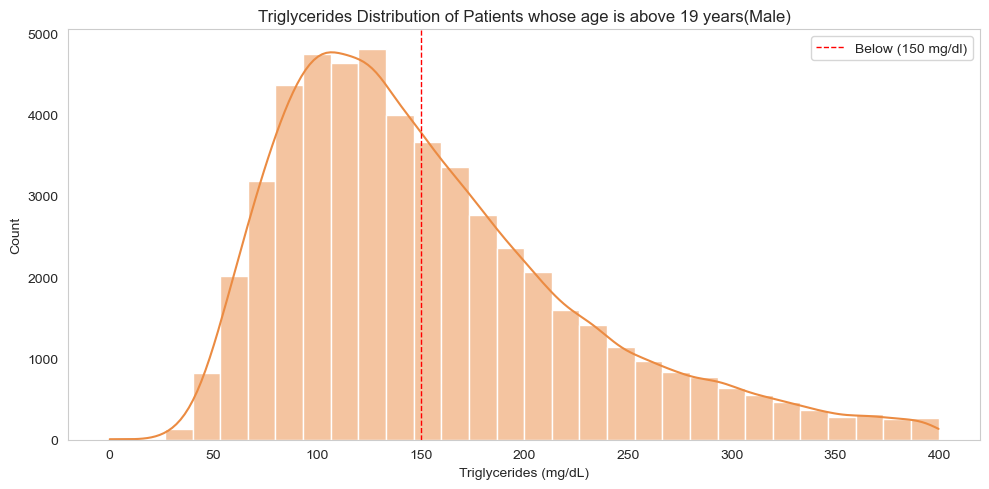

In [40]:
data_triglycerides_above_19_males = data_triglycerides[(data_triglycerides['age']>19) &(data_triglycerides['gender']=='male')]

plt.figure(figsize=(10, 5))
sns.set_style("whitegrid")
sns.histplot(data=data_triglycerides_above_19_males, x='value', bins=30, kde=True, color='#eb8b42')
# plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0)')
plt.axvline(x=150, color='red', linestyle='--', linewidth=1, label='Below (150 mg/dl)')
plt.title('Triglycerides Distribution of Patients whose age is above 19 years(Male)')
plt.xlabel('Triglycerides (mg/dL)')
plt.ylabel('Count')
plt.grid(False)
plt.legend()
plt.tight_layout()
plt.show()

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



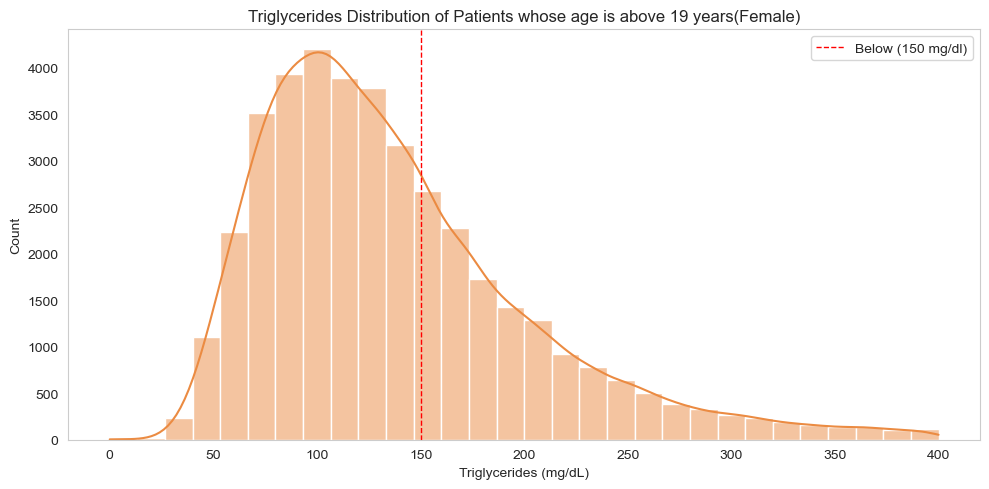

In [41]:
data_triglycerides_above_19_females = data_triglycerides[(data_triglycerides['age']>19) &(data_triglycerides['gender']=='female')]

plt.figure(figsize=(10, 5))
sns.set_style("whitegrid")
sns.histplot(data=data_triglycerides_above_19_females, x='value', bins=30, kde=True, color='#eb8b42')
# plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0)')
plt.axvline(x=150, color='red', linestyle='--', linewidth=1, label='Below (150 mg/dl)')
plt.title('Triglycerides Distribution of Patients whose age is above 19 years(Female)')
plt.xlabel('Triglycerides (mg/dL)')
plt.ylabel('Count')
plt.grid(False)
plt.legend()
plt.tight_layout()
plt.show()

### Distribution of Total Cholesterol

In [42]:
data_total = data[data['loinc'].isin(total_choles)]

In [43]:
data_total.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range
19,a1ce7f03fca11a7351927f5d6d635552,72,female,total cholesterol,125.0 - 200.0,174.00,mg/dl,blood,2093-3,>60 yrs,blood,True
89,7cb374e4e2b825c5af8206157026b16f,40,male,total cholesterol,borderline high: 200-239\nhigh: > 239\ndesirab...,237.89,mg/dL,blood,2093-3,21-40yrs,blood,True
166,fb1e52cde47cc795f457196c6ffaa52b,55,male,total cholesterol,desirable <200\nborderline 200-239\nhigh >240,138.00,mg/dL,blood,2093-3,41-60yrs,blood,True
283,75f7a1c823a5229c96cd3eb0d717f059,55,female,total cholesterol,< 200.0,208.00,mg/dL,blood,2093-3,41-60yrs,blood,False
347,518edc22415cb7ef8b9fd1a037245208,78,female,total cholesterol,150-220\nborderline high -220-260\nhigh: > 260,170.00,mg/dl,blood,2093-3,>60 yrs,blood,True


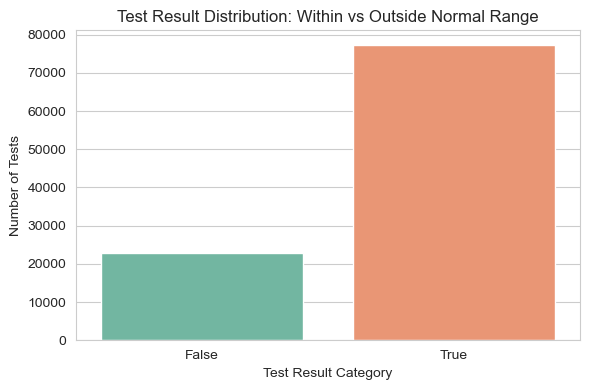

In [44]:
plt.figure(figsize=(6, 4))
sns.countplot(data=data_total, x='in_range', palette='Set2')
plt.title('Test Result Distribution: Within vs Outside Normal Range')
plt.xlabel('Test Result Category')
plt.ylabel('Number of Tests')
plt.tight_layout()
plt.show()


In [45]:
data_total['unit'] = data_total['unit'].str.lower()

# Clean the list and fix the "mg / dl" format
data_total['unit'] = [' '.join(item.strip().split()) for item in data_total['unit']]

# Assuming your DataFrame is named data_total
data_total['unit'] = data_total['unit'].apply(lambda item: item
                                              .replace(' / ', '/')
                                              .replace('.', '')
                                              .replace(' ', '')
                                              .replace('mgdl', 'mg/dl')
                                              .replace('mg\\dl', 'mg/dl')
                                             .replace('mg/di', 'mg/dl')
                                             .replace('mgs/dl', 'mg/dl')
                                             .replace('mgdi', 'mg/dl')
                                             .replace('[mg/dl]', 'mg/dl')
                                             .replace('mg%)', 'mg%')
                                             .replace('mg%]', 'mg%')
                                             .replace('mg/dl)', 'mg/dl'))  # Add more replaces as needed


# data_total['unit'] = data_total['unit'].str.lower()

# Print the cleaned data
print(data_total['unit'].unique())

['mg/dl' 'mmol/l' 'mg%' 'gm/dl' 'mg/l' 'g/dl']


/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/4097351838.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/4097351838.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/4097351838.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [46]:
conversion_factors = {
    'mg/dl': 1,
    'mmol/l': 38.67,
    'mg%': 1,
    'gm/dl': 1000,
    'mg/l': 0.1,
    'g/dl': 1000
}

# Function to convert values to mg/dl
def convert_to_mg_dl(row):
    return row['value'] * conversion_factors[row['unit']]

# Apply conversion
data_total['value'] = data_total[['value', 'unit']].apply(convert_to_mg_dl, axis=1)

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/146454218.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [47]:
data_total.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range
19,a1ce7f03fca11a7351927f5d6d635552,72,female,total cholesterol,125.0 - 200.0,174.00,mg/dl,blood,2093-3,>60 yrs,blood,True
89,7cb374e4e2b825c5af8206157026b16f,40,male,total cholesterol,borderline high: 200-239\nhigh: > 239\ndesirab...,237.89,mg/dl,blood,2093-3,21-40yrs,blood,True
166,fb1e52cde47cc795f457196c6ffaa52b,55,male,total cholesterol,desirable <200\nborderline 200-239\nhigh >240,138.00,mg/dl,blood,2093-3,41-60yrs,blood,True
283,75f7a1c823a5229c96cd3eb0d717f059,55,female,total cholesterol,< 200.0,208.00,mg/dl,blood,2093-3,41-60yrs,blood,False
347,518edc22415cb7ef8b9fd1a037245208,78,female,total cholesterol,150-220\nborderline high -220-260\nhigh: > 260,170.00,mg/dl,blood,2093-3,>60 yrs,blood,True


In [48]:
import plotly.express as px
px.box(data_total, y = 'value')

In [49]:
data_total[data_total['value']>10000]

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range
674569,60e4fd78cdf350de516ff45847f258be,73,female,cholesterol,"<200 desirable,",10556.91,mmol/l,blood,14647-2,>60 yrs,blood,False
722218,5f9e0101329c426c5ea2139e6e9ae436,73,female,cholesterol,"<200 desirable,",10556.91,mmol/l,blood,14647-2,>60 yrs,blood,False
2848128,43530d5abf358aef6b81cabdbb5ea7f9,28,male,total cholesterol,150.0 - 200.0,230000.00,gm/dl,blood,2093-3,21-40yrs,blood,False
3317126,3a985421d8124862a1aaba8404c6dd95,73,female,cholesterol,"<200 desirable,",10556.91,mmol/l,blood,14647-2,>60 yrs,blood,False
5356981,ea763eb606f84016b5ad0708bee27c56,73,female,cholesterol,"<200 desirable,",10556.91,mmol/l,blood,14647-2,>60 yrs,blood,False
6814380,4193f58ee3b5102d7cdc78bd54e37095,69,male,*cholestrol,150.0 - 250.0,191920.00,g/dl,blood,2093-3,>60 yrs,blood,True


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



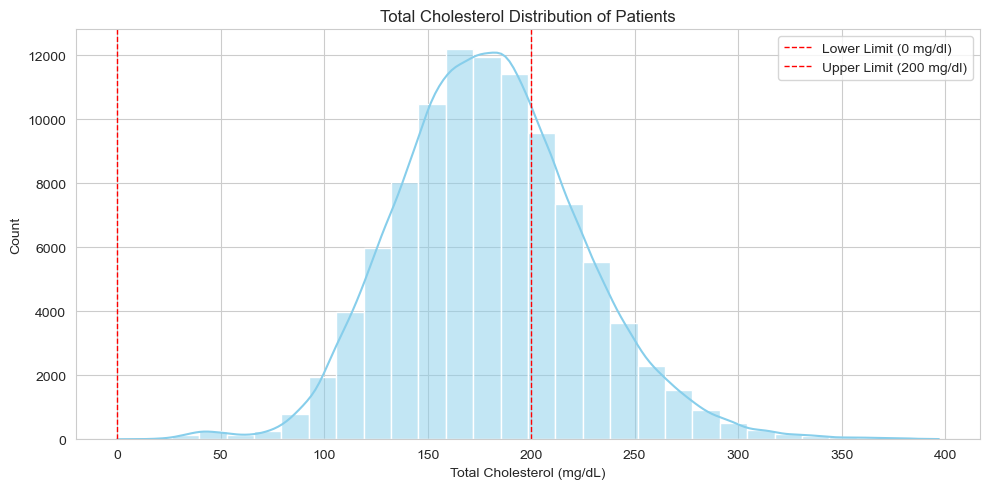

In [50]:
# Remove the outliers

data_total = data_total[data_total['value']<400]

sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))
sns.histplot(data=data_total, x='value', bins=30, kde=True, color='skyblue')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=200, color='red', linestyle='--', linewidth=1, label='Upper Limit (200 mg/dl)')
plt.title('Total Cholesterol Distribution of Patients')
plt.xlabel('Total Cholesterol (mg/dL)')
plt.ylabel('Count')
# plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



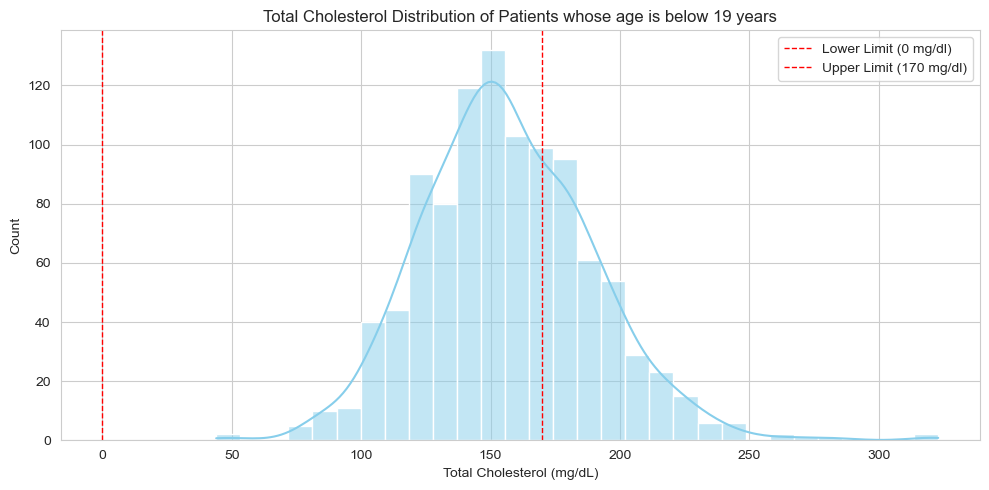

In [51]:
## Distribution by age

# < 19 :  below 170
# 20 and older : 125 to 200


data_total_below_19 = data_total[data_total['age']<=19]
sns.set_style("whitegrid")

plt.figure(figsize=(10, 5))
sns.histplot(data=data_total_below_19, x='value', bins=30, kde=True, color='skyblue')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=170, color='red', linestyle='--', linewidth=1, label='Upper Limit (170 mg/dl)')
plt.title('Total Cholesterol Distribution of Patients whose age is below 19 years')
plt.xlabel('Total Cholesterol (mg/dL)')
plt.ylabel('Count')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



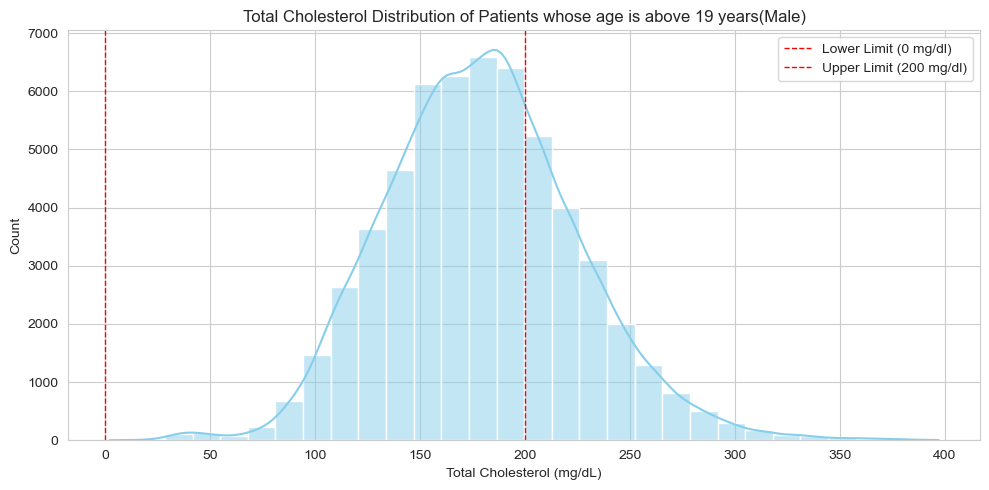

In [52]:
data_total_above_19_males = data_total[(data_total['age']>19) &(data_total['gender']=='male')]

plt.figure(figsize=(10, 5))
sns.set_style("whitegrid")
sns.histplot(data=data_total_above_19_males, x='value', bins=30, kde=True, color='skyblue')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=200, color='red', linestyle='--', linewidth=1, label='Upper Limit (200 mg/dl)')
plt.title('Total Cholesterol Distribution of Patients whose age is above 19 years(Male)')
plt.xlabel('Total Cholesterol (mg/dL)')
plt.ylabel('Count')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



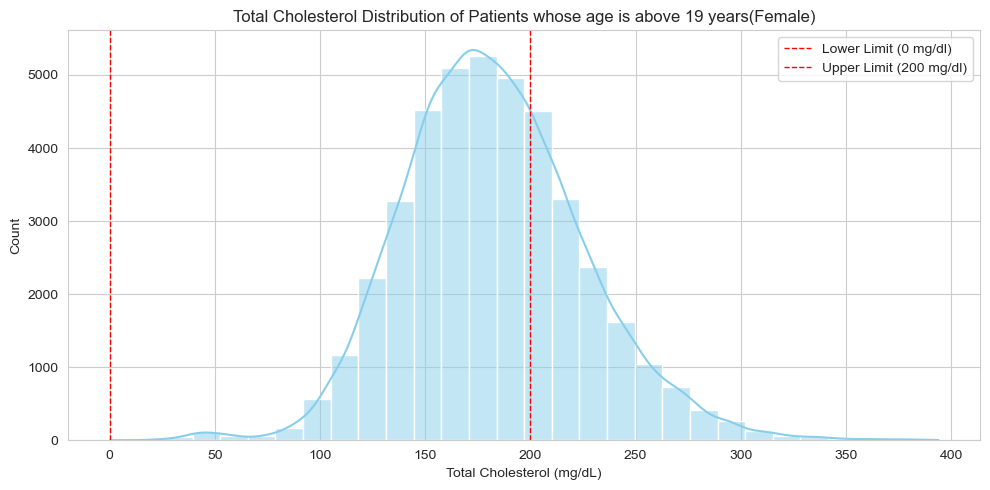

In [53]:
data_total_above_19_females = data_total[(data_total['age']>19) &(data_total['gender']=='female')]

plt.figure(figsize=(10, 5))
sns.set_style("whitegrid")
sns.histplot(data=data_total_above_19_females, x='value', bins=30, kde=True, color='skyblue')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=200, color='red', linestyle='--', linewidth=1, label='Upper Limit (200 mg/dl)')
plt.title('Total Cholesterol Distribution of Patients whose age is above 19 years(Female)')
plt.xlabel('Total Cholesterol (mg/dL)')
plt.ylabel('Count')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### LDL cholesterol

In [54]:
data_ldl = data[data['loinc'].isin(['2089-1','22748-8'])]

In [55]:
data_ldl.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range
16,a1ce7f03fca11a7351927f5d6d635552,72,female,ldl cholesterol direct,85.0 - 130.0,64.00,mg/dl,blood,2089-1,>60 yrs,blood,False
97,7cb374e4e2b825c5af8206157026b16f,40,male,ldl cholesterol-direct,optimal: < 100\nnear optimal/above optimal: 10...,167.57,mg/dL,blood,2089-1,21-40yrs,blood,True
163,fb1e52cde47cc795f457196c6ffaa52b,55,male,ldl cholesterol,optimal <100\nnear optimal/above optimal\n100-...,85.10,mg/dL,blood,2089-1,41-60yrs,blood,True
280,75f7a1c823a5229c96cd3eb0d717f059,55,female,ldl cholesterol direct,< 100.0,142.00,mg/dL,blood,2089-1,41-60yrs,blood,False
344,518edc22415cb7ef8b9fd1a037245208,78,female,ldl- cholesterol,60.0-130.0\nborderline high: 130-159\nhigh: >160,54.60,mg/dl,blood,2089-1,>60 yrs,blood,False


In [56]:
data_ldl = data_ldl[~data_ldl['value'].isna()]



In [57]:
data_ldl['unit'] = data_ldl['unit'].str.lower()

# Clean the list and fix the "mg / dl" format
data_ldl['unit'] = [' '.join(item.strip().split()) for item in data_ldl['unit']]

# Assuming your DataFrame is named data_total
data_ldl['unit'] = data_ldl['unit'].apply(lambda item: item
                                              .replace(' / ', '/')
                                              .replace('.', '')
                                              .replace(' ', '')
                                              .replace('mgdl', 'mg/dl')
                                              .replace('mg\\dl', 'mg/dl')
                                             .replace('mg/di', 'mg/dl')
                                             .replace('mgs/dl', 'mg/dl')
                                             .replace('mgdi', 'mg/dl')
                                             .replace('[mg/dl]', 'mg/dl')
                                             .replace('mg%)', 'mg%')
                                             .replace('mg%]', 'mg%')
                                             .replace('mg/dl)', 'mg/dl')
                                         .replace('(mg/dl)', 'mg/dl')
                                        .replace('mg/dli', 'mg/dl')
                                         .replace('(mg/dl', 'mg/dl')
                                         .replace('mg/dll', 'mg/dl'))  # Add more replaces as needed




# Print the cleaned data
print(data_ldl['unit'].unique())

['mg/dl' 'mg%' 'mmol/l' 'g/dl' 'gm/dl' 'ng/ml' 'nmol/l' 'mg/l']


In [58]:
# Conversion factors to mg/dL
conversion_factors = {
    'mg/dl': 1,
    'mg%': 1,
    'mmol/l': 38.67,   # This is specific for cholesterol — values differ by analyte
    'g/dl': 1000,
    'gm/dl': 1000,
    'mg/l': 0.1,
    'ng/ml': 0.1,      # 1 ng/mL = 0.1 mg/dL
    'nmol/l': 0.000387  # Example for Vitamin D — actual factor depends on analyte!
}

# Function to convert to mg/dl
def convert_to_mg_dl(row):
    factor = conversion_factors.get(row['unit'], None)
    if factor is not None:
        return row['value'] * factor
    else:
        return None  # or row['value'] if you want to keep original when unknown

data_ldl['value'] = data_ldl[['value','unit']].apply(convert_to_mg_dl, axis = 1)

In [59]:
px.box(data_ldl, y = 'value')



In [60]:
# Remove the outliers

data_ldl = data_ldl[data_ldl['value']<400]

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



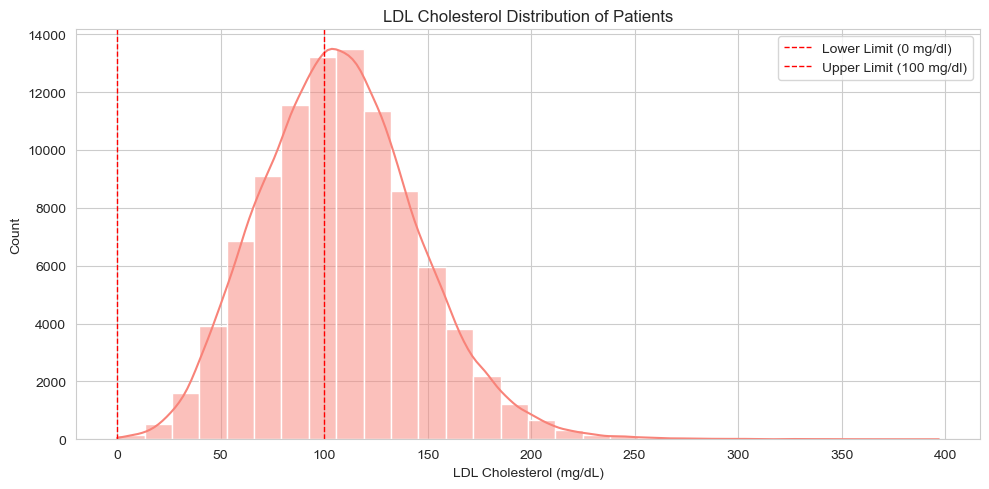

In [61]:
plt.figure(figsize=(10, 5))
sns.histplot(data=data_ldl, x='value', bins=30, kde=True, color='#F88379')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=100, color='red', linestyle='--', linewidth=1, label='Upper Limit (100 mg/dl)')
plt.title('LDL Cholesterol Distribution of Patients')
plt.xlabel('LDL Cholesterol (mg/dL)')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



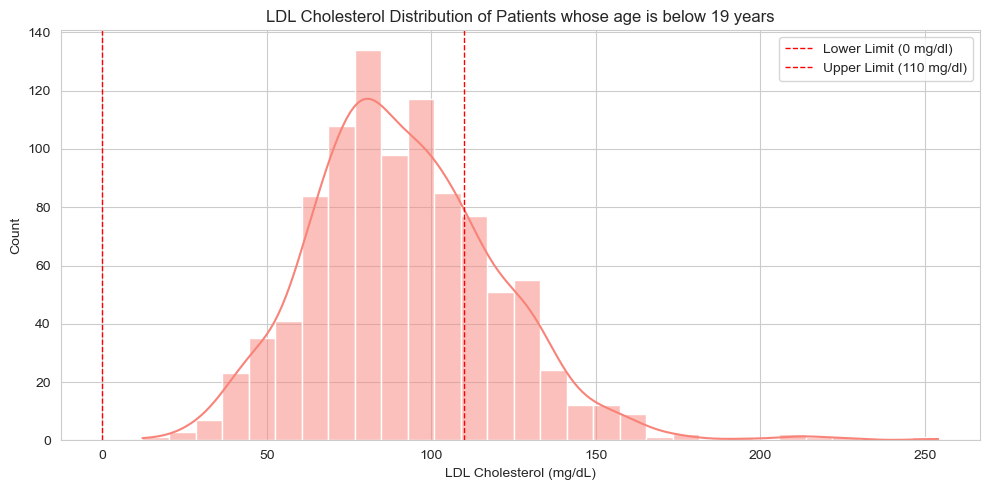

In [62]:
data_ldl_below_19 = data_ldl[data_ldl['age']<=19]

plt.figure(figsize=(10, 5))
sns.histplot(data=data_ldl_below_19, x='value', bins=30, kde=True, color='#F88379')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=110, color='red', linestyle='--', linewidth=1, label='Upper Limit (110 mg/dl)')
plt.title('LDL Cholesterol Distribution of Patients whose age is below 19 years')
plt.xlabel('LDL Cholesterol (mg/dL)')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



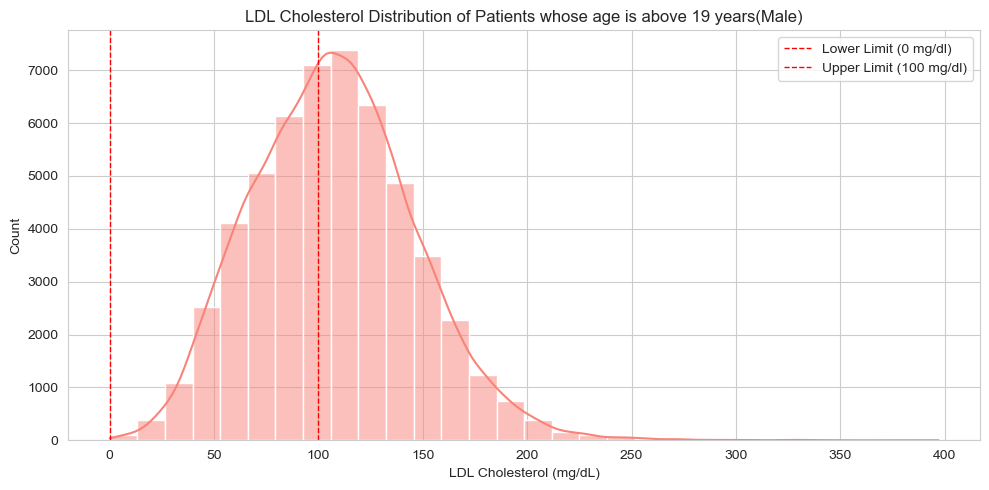

In [63]:
data_ldl_above_19_males = data_ldl[(data_ldl['age']>19) &(data_ldl['gender']=='male')]

plt.figure(figsize=(10, 5))
sns.histplot(data=data_ldl_above_19_males, x='value', bins=30, kde=True, color='#F88379')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=100, color='red', linestyle='--', linewidth=1, label='Upper Limit (100 mg/dl)')
plt.title('LDL Cholesterol Distribution of Patients whose age is above 19 years(Male)')
plt.xlabel('LDL Cholesterol (mg/dL)')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



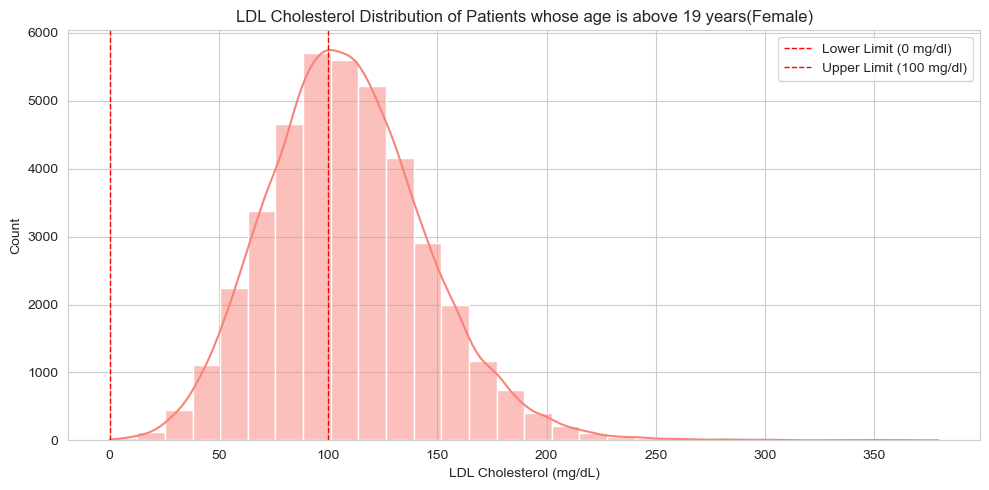

In [64]:
data_ldl_above_19_females = data_ldl[(data_ldl['age']>19) &(data_ldl['gender']=='female')]

plt.figure(figsize=(10, 5))
sns.histplot(data=data_ldl_above_19_females, x='value', bins=30, kde=True, color='#F88379')
plt.axvline(x=0, color='red', linestyle='--', linewidth=1, label='Lower Limit (0 mg/dl)')
plt.axvline(x=100, color='red', linestyle='--', linewidth=1, label='Upper Limit (100 mg/dl)')
plt.title('LDL Cholesterol Distribution of Patients whose age is above 19 years(Female)')
plt.xlabel('LDL Cholesterol (mg/dL)')
plt.ylabel('Count')
# plt.grid(False)
plt.legend()
plt.tight_layout()
plt.show()

### HDL Cholesterol


In [65]:
data_hdl = data[data['loinc'].isin(good_choles)]
data_hdl.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range
14,a1ce7f03fca11a7351927f5d6d635552,72,female,hdl cholesterol direct,35.0 - 80.0,73.00,mg/dl,blood,2085-9,>60 yrs,blood,True
82,7cb374e4e2b825c5af8206157026b16f,40,male,hdl cholesterol-direct,40.0 - 60.0,46.07,mg/dL,blood,2085-9,21-40yrs,blood,True
161,fb1e52cde47cc795f457196c6ffaa52b,55,male,hdl cholesterol,> 40.0,30.30,mg/dL,blood,2085-9,41-60yrs,blood,False
278,75f7a1c823a5229c96cd3eb0d717f059,55,female,hdl cholesterol direct,40.0 - 60.0,56.00,mg/dL,blood,2085-9,41-60yrs,blood,True
343,518edc22415cb7ef8b9fd1a037245208,78,female,hdl-cholesterol,40.0 - 60.0,54.54,mg/dl,blood,2085-9,>60 yrs,blood,True


In [66]:
data_hdl['unit'].unique()

array(['mg/dl', 'mg/dL', 'mg/d L', 'mg / dL', 'MG/DL', 'mg / dl.',
       'mg / dl', 'mg%', 'mg.dl.', 'mmol/L', 'mg/dl.', 'mgs/dl', 'mg /dl',
       'Mg/DL', 'mg %', 'mg/ dl', 'mg/dL.', 'mg\\dl', 'mgs / dl',
       'mg / dl)', 'Mg/dl', 'mg/Dl', 'mg/ dL', 'mg di', 'mg. / dl.',
       'ma/dl', 'mg / di', 'mmol/l', 'mg/di.', 'umol/L', 'mg/di', 'mg dl',
       'mg dL', 'gm/dl', 'mg./dL', 'mg/dl)', 'mg/L', 'MG%', '[mg/dL]',
       'mmol /L', 'MG%]', 'mg /dL', 'Mg/dl.', 'mg / / dL', 'mg/dl [',
       'MG %', 'mgs/dL', 'Mgs/dl', 'MMOL/L', 'MGS/DL'], dtype=object)

In [67]:
data_hdl['unit'] = data_hdl['unit'].str.lower()

# Clean the list and fix the "mg / dl" format
data_hdl['unit'] = [' '.join(item.strip().split()) for item in data_hdl['unit']]

# Assuming your DataFrame is named data_total
data_hdl['unit'] = data_hdl['unit'].apply(lambda item: item
                                              .replace(' / ', '/')
                                              .replace('.', '')
                                              .replace(' ', '')
                                              .replace('mgdl', 'mg/dl')
                                              .replace('mg\\dl', 'mg/dl')
                                             .replace('mg/di', 'mg/dl')
                                             .replace('mgs/dl', 'mg/dl')
                                             .replace('mgdi', 'mg/dl')
                                             .replace('[mg/dl]', 'mg/dl')
                                             .replace('mg%)', 'mg%')
                                             .replace('mg%]', 'mg%')
                                             .replace('mg/dl)', 'mg/dl')
                                         .replace('(mg/dl)', 'mg/dl')
                                        .replace('mg/dli', 'mg/dl')
                                         .replace('(mg/dl', 'mg/dl')
                                         .replace('mg/dll', 'mg/dl').
                                         replace('ma/dl', 'mg/dl')
                                         .replace('mg//dl', 'mg/dl')
                                         .replace('mg/dl[', 'mg/dl'))  # Add more replaces as needed




# Print the cleaned data
print(data_hdl['unit'].unique())



['mg/dl' 'mg%' 'mmol/l' 'umol/l' 'gm/dl' 'mg/l']


/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/1926459823.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/1926459823.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/1926459823.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [68]:
# Conversion factors to mg/dL
conversion_factors = {
    'mg/dl': 1,
    'mg%': 1,
    'mmol/l': 38.67,   # This is specific for cholesterol — values differ by analyte
    'umol/l': 0.0387,
    'g/dl': 1000,
    'gm/dl': 1000,
    'mg/l': 0.1,
    'ng/ml': 0.1,      # 1 ng/mL = 0.1 mg/dL
    'nmol/l': 0.000387  # Example for Vitamin D — actual factor depends on analyte!
}

# Function to convert to mg/dl
def convert_to_mg_dl(row):
    factor = conversion_factors.get(row['unit'], None)
    if factor is not None:
        return row['value'] * factor
    else:
        return None  # or row['value'] if you want to keep original when unknown

data_hdl['value'] = data_hdl[['value','unit']].apply(convert_to_mg_dl, axis = 1)

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/964917683.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [69]:
data_hdl = data_hdl[data_hdl['value']<400]

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



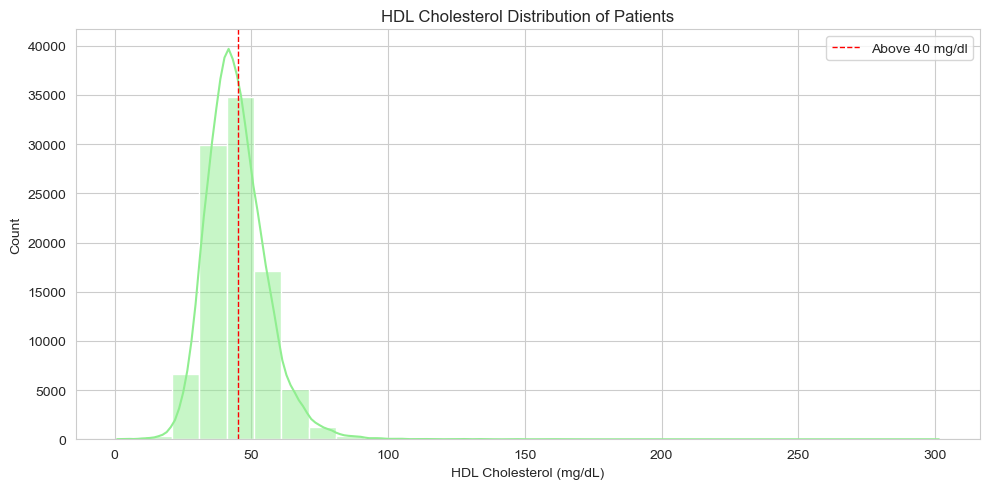

In [70]:
plt.figure(figsize=(10, 5))
sns.histplot(data=data_hdl, x='value', bins=30, kde=True, color='#90EE90')
plt.axvline(x=45, color='red', linestyle='--', linewidth=1, label='Above 40 mg/dl')
# plt.axvline(x=100, color='red', linestyle='--', linewidth=2, label='Upper Limit (200)')
plt.title('HDL Cholesterol Distribution of Patients')
plt.xlabel('HDL Cholesterol (mg/dL)')
plt.ylabel('Count')
# plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



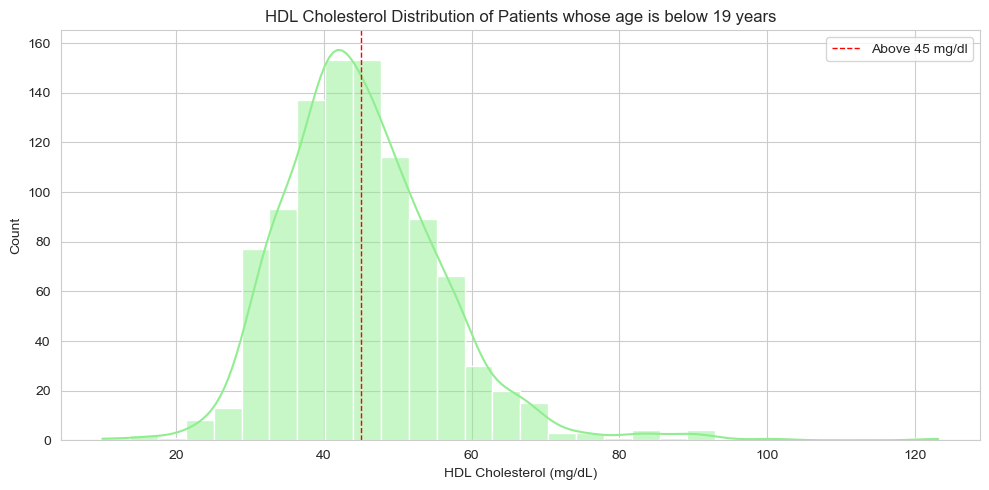

In [71]:
data_hdl_below_19 = data_hdl[data_hdl['age']<=19]

plt.figure(figsize=(10, 5))
sns.histplot(data=data_hdl_below_19, x='value', bins=30, kde=True, color='#90EE90')
plt.axvline(x=45, color='red', linestyle='--', linewidth=1, label='Above 45 mg/dl')
# plt.axvline(x=110, color='red', linestyle='--', linewidth=2, label='Upper Limit (200)')
plt.title('HDL Cholesterol Distribution of Patients whose age is below 19 years')
plt.xlabel('HDL Cholesterol (mg/dL)')
plt.ylabel('Count')
# plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



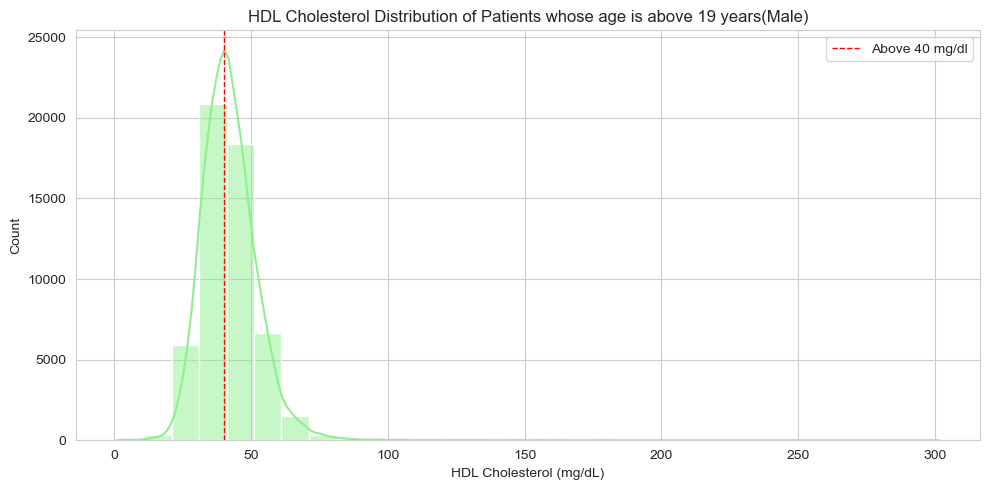

In [72]:
data_hdl_above_19_males = data_hdl[(data_hdl['age']>19) &(data_hdl['gender']=='male')]

plt.figure(figsize=(10, 5))
sns.histplot(data=data_hdl_above_19_males, x='value', bins=30, kde=True, color='#90EE90')
# plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Lower Limit (0)')
plt.axvline(x=40, color='red', linestyle='--', linewidth=1, label='Above 40 mg/dl')
plt.title('HDL Cholesterol Distribution of Patients whose age is above 19 years(Male)')
plt.xlabel('HDL Cholesterol (mg/dL)')
plt.ylabel('Count')
# plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



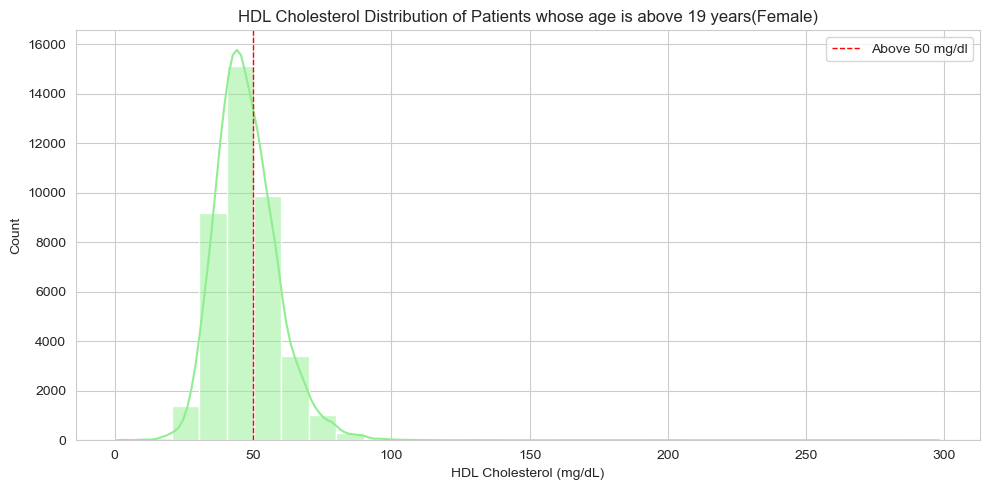

In [73]:
data_hdl_above_19_females = data_hdl[(data_hdl['age']>19) &(data_hdl['gender']=='female')]

plt.figure(figsize=(10, 5))
sns.histplot(data=data_hdl_above_19_females, x='value', bins=30, kde=True, color='#90EE90')
plt.axvline(x=50, color='red', linestyle='--', linewidth=1, label='Above 50 mg/dl')
# plt.axvline(x=100, color='red', linestyle='--', linewidth=2, label='Upper Limit (200)')
plt.title('HDL Cholesterol Distribution of Patients whose age is above 19 years(Female)')
plt.xlabel('HDL Cholesterol (mg/dL)')
plt.ylabel('Count')
# plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### Ratio factors for cardiovascular health

In [74]:
ratio = ['9830-1', '11054-4', '16616-5', '44733-4']
ratio

['9830-1', '11054-4', '16616-5', '44733-4']

tc/hdl - Ideal ratio: 3.5 or lower


Acceptable ratio: 3.5 to 5


High risk: Greater than 5


ldl/hdl - 


Ideal Ratio: Less than 2.5

Acceptable Ratio: 2.5 to 3.5

High Risk: Above 3.5


hdl/ldl - 


Ideal Ratio: Above 1.0

Acceptable Ratio: 0.5 to 1.0

High Risk: Below 0.5


tgl/hdl - 

Ideal: Below 2.0 (Lower risk of cardiovascular disease)

Borderline high: 2.0 to 3.0 (Moderate risk)

High risk: Above 3.0 (Increased risk of cardiovascular disease)


In [75]:
data_ratio = data[data['loinc'].isin(ratio)]

In [76]:
data_ratio['unit'] = data_ratio['unit'].str.lower()

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/802298830.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [77]:
data_ratio[data_ratio['loinc']=='44733-4']

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range
101,7cb374e4e2b825c5af8206157026b16f,40,male,tgl / hdl ratio,< 2.0,2.73,ratio,blood,44733-4,21-40yrs,blood,False
284,75f7a1c823a5229c96cd3eb0d717f059,55,female,trig / hdl ratio,< 3.12,2.44,ratio,blood,44733-4,41-60yrs,blood,True
508,2d718c5af570c6eb62270e6aec3810ef,55,male,tgl / hdl ratio,< 2.0,9.75,ratio,blood,44733-4,41-60yrs,blood,False
637,6d877d1e8d5c88e5acd7d56845bae500,50,female,tgl / hdl ratio,< 2.0,2.56,it,blood,44733-4,41-60yrs,blood,False
977,803f5fd43b186391ee3fd98dcb55ca9f,49,male,tgl/hdl ratio,ideal : less than 2,4.10,ratio,blood,44733-4,41-60yrs,blood,False
...,...,...,...,...,...,...,...,...,...,...,...,...
6843450,c454974e49a2c664c42eef4d8897de4a,66,male,tgl / hdl ratio,< 2.0,3.53,11,blood,44733-4,>60 yrs,blood,False
6843701,50017265a1b5af3e3aadd25730122ae6,28,female,trig / hdl ratio,< 3.12,0.88,ratio,blood,44733-4,21-40yrs,blood,True
6843808,403e25f347dff996371b83708541a23e,75,female,tgl / hdl ratio,< 2.0,1.63,ratio,blood,44733-4,>60 yrs,blood,True
6843956,7fbd7364dc1fb25f56aa1639a8917a5f,32,male,trig / hdl ratio,< 3.12,3.65,ratio,blood,44733-4,21-40yrs,blood,False


In [78]:
# Function to classify TC/HDL ratio
def classify_tc_hdl(ratio):
    if ratio <= 3.5:
        return "Ideal"
    elif 3.5 < ratio <= 5:
        return "Acceptable"
    else:
        return "High Risk"

# Function to classify LDL/HDL ratio
def classify_ldl_hdl(ratio):
    if ratio < 2.5:
        return "Ideal"
    elif 2.5 <= ratio <= 3.5:
        return "Acceptable"
    else:
        return "High Risk"

# Function to classify HDL/LDL ratio
def classify_hdl_ldl(ratio):
    if ratio > 1.0:
        return "Ideal"
    elif 0.5 <= ratio <= 1.0:
        return "Acceptable"
    else:
        return "High Risk"

# Function to classify TGL/HDL ratio
def classify_tgl_hdl(ratio):
    if ratio < 2.0:
        return "Ideal"
    elif 2.0 <= ratio <= 3.0:
        return "Acceptable"
    else:
        return "High Risk"

In [79]:
def classify_cardiovaccular_risks(row):
    loinc = row['loinc']
    ratio = row['value']
    if loinc == '9830-1':
        risk_factor = classify_tc_hdl(ratio)
    elif loinc == '11054-4':
        risk_factor = classify_ldl_hdl(ratio)
    elif loinc == '16616-5':
        risk_factor = classify_hdl_ldl(ratio)
    elif loinc == '44733-4':
        risk_factor = classify_tgl_hdl(ratio)
    else:
        risk_factor = None
    return risk_factor

In [80]:
data_ratio['risk_factor'] = data_ratio[['value', 'loinc']].apply(classify_cardiovaccular_risks, axis = 1)


/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/1295926391.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [81]:
data_ratio.head()

,document_id,age,gender,test_name,display_ranges,value,unit,specimen,loinc,age_group,max_specimen,in_range,risk_factor
15,a1ce7f03fca11a7351927f5d6d635552,72,female,ldl / hdl ratio,1.5 - 3.5,0.90,ratio,blood,11054-4,>60 yrs,blood,False,Ideal
18,a1ce7f03fca11a7351927f5d6d635552,72,female,tc/ hdl cholesterol ratio,3.0 - 5.0,2.40,ratio,blood,9830-1,>60 yrs,blood,False,Ideal
94,7cb374e4e2b825c5af8206157026b16f,40,male,cholesterol / hdl ratio,3.9 - 5.0,5.16,ratio,blood,9830-1,21-40yrs,blood,False,High Risk
96,7cb374e4e2b825c5af8206157026b16f,40,male,ldl / hdl ratio,high risk: more than 6.0\nborderline: 3.0-4.0\...,3.64,ratio,blood,11054-4,21-40yrs,blood,True,High Risk
101,7cb374e4e2b825c5af8206157026b16f,40,male,tgl / hdl ratio,< 2.0,2.73,ratio,blood,44733-4,21-40yrs,blood,False,Acceptable


In [113]:
## Firstly find the max count risk for each document_id

data_ratio = data_ratio[data_ratio['value']<=10]
sorted_data = data_ratio.groupby(['document_id','age_group', 'gender', 'risk_factor']).size().reset_index(name = 'count').sort_values(['document_id','count'])


risk_priority = {'High Risk': 0, 'Acceptable': 1, 'Ideal': 2}
sorted_data['priority'] = sorted_data['risk_factor'].map(risk_priority)

sorted_data = sorted_data.sort_values(by=['document_id', 'count', 'priority'], ascending=[True, False, True])

# Keep only the first occurrence (i.e., the highest count and highest priority) for each document_id
sorted_data = sorted_data.drop_duplicates(subset=['document_id'], keep='first')


In [114]:
data_ratio['document_id'].nunique()

87761

In [115]:
risk_counts = sorted_data.groupby(['risk_factor'])['document_id'].nunique()
risk_counts

risk_factor
Acceptable    34688
High Risk     25583
Ideal         27490
Name: document_id, dtype: int64

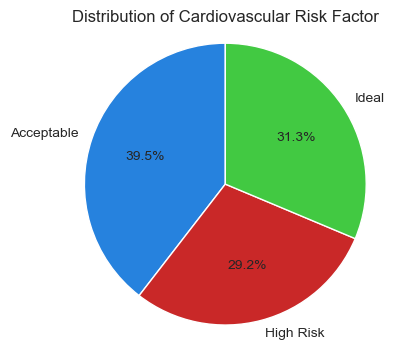

In [116]:
# Get the value counts for the risk_factor column
# risk_counts = data_ratio['risk_factor'].value_counts()

# Create the pie chart
plt.figure(figsize=(4, 4))  # Optional: Adjust size of the chart
plt.pie(risk_counts, labels=risk_counts.index, autopct='%1.1f%%', startangle=90, colors=['#2682de','#c92828','#42c942'])
plt.title('Distribution of Cardiovascular Risk Factor')
plt.axis('equal')  # Equal aspect ratio ensures that pie chart is drawn as a circle.
plt.show()

In [117]:
high_risk_data = sorted_data[sorted_data['risk_factor']=='High Risk'].groupby(['age_group', 'gender'])['document_id'].nunique().reset_index(name = 'count')





In [118]:
high_risk_data

,age_group,gender,count
0,13-20 yrs,female,101
1,13-20 yrs,male,167
2,21-40yrs,female,2456
3,21-40yrs,male,7265
4,41-60yrs,female,4167
5,41-60yrs,male,7444
6,>60 yrs,female,1595
7,>60 yrs,male,2388


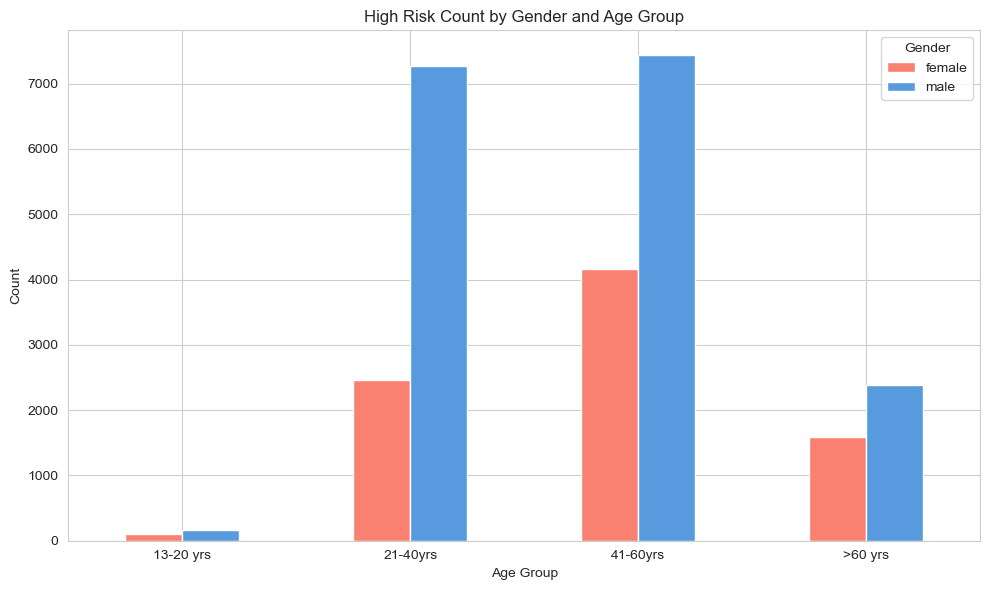

In [121]:
# Pivot the data to get separate columns for male/female
pivot_df = high_risk_data.pivot(index='age_group', columns='gender', values='count')

# Plotting
pivot_df.plot(kind='bar', figsize=(10, 6), color=['skyblue', 'salmon'])

plt.title('High Risk Count by Gender and Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

### Fasting Glucose

In [87]:
fasting_glucose = data[data['loinc'].isin(['1558-6', '14771-0'])]

In [88]:
fasting_glucose['unit']= fasting_glucose['unit'].str.lower()

/var/folders/pd/_qgptw4116qd3yy48lzsvp400000gn/T/ipykernel_3225/620026295.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [89]:
fasting_glucose['unit'].unique()

array(['mg/dl', 'mg / dl', 'mmol/l', 'mg/dl.', 'mgs/dl', 'mg. / dl.',
       'mg/ dl', 'mg%', 'mg/d l', 'mg/dl)', 'mg /dl', None, 'mg %',
       'mg\\dl', 'g/dl', 'mg/dl]', 'mg dl', '#mg/dl', 'mg%)', 'mg. %',
       'mg / di', 'mcg/dl', '# mg/dl', 'mg/di.', 'mg/dl..', 'mgs/dl)',
       'gm/dl', 'ug/ml'], dtype=object)

In [90]:
fasting_glucose  =fasting_glucose[~fasting_glucose['unit'].isna()]
# Clean the list and fix the "mg / dl" format
fasting_glucose['unit'] = [' '.join(item.strip().split()) for item in fasting_glucose['unit']]

# Assuming your DataFrame is named data_total
fasting_glucose['unit'] = fasting_glucose['unit'].apply(lambda item: item
                                              .replace(' / ', '/')
                                              .replace('.', '')
                                              .replace(' ', '')
                                              .replace('mgdl', 'mg/dl')
                                              .replace('mg\\dl', 'mg/dl')
                                             .replace('mg/di', 'mg/dl')
                                             .replace('mgs/dl', 'mg/dl')
                                             .replace('mgdi', 'mg/dl')
                                             .replace('[mg/dl]', 'mg/dl')
                                             .replace('mg%)', 'mg%')
                                             .replace('mg%]', 'mg%')
                                             .replace('mg/dl)', 'mg/dl')
                                         .replace('(mg/dl)', 'mg/dl')
                                        .replace('mg/dli', 'mg/dl')
                                         .replace('(mg/dl', 'mg/dl')
                                         .replace('mg/dll', 'mg/dl').
                                         replace('ma/dl', 'mg/dl')
                                         .replace('mg//dl', 'mg/dl')
                                         .replace('mg/dl[', 'mg/dl')
                                                       .replace('mg/dl]', 'mg/dl')
                                                       .replace('#mg/dl', 'mg/dl')
                                                       .replace('mcg/dl', 'mg/dl'))  # Add more replaces as needed




# Print the cleaned data
print(fasting_glucose['unit'].unique())

['mg/dl' 'mmol/l' 'mg%' 'g/dl' 'gm/dl' 'ug/ml']


In [91]:
# Conversion factors to mg/dL
conversion_factors = {
    'mg/dl': 1,
    'mg%': 1,
    'mmol/l': 18,   # This is specific for cholesterol — values differ by analyte
    'umol/l': 0.018,
    'g/dl': 1000,
    'gm/dl': 1000,
    'mg/l': 0.1,
    'ng/ml': 0.1,      # 1 ng/mL = 0.1 mg/dL
    'nmol/l': 0.000018  # Example for Vitamin D — actual factor depends on analyte!
}

# Function to convert to mg/dl
def convert_to_mg_dl(row):
    factor = conversion_factors.get(row['unit'], None)
    if factor is not None:
        return row['value'] * factor
    else:
        return None  # or row['value'] if you want to keep original when unknown

fasting_glucose['value'] = fasting_glucose[['value','unit']].apply(convert_to_mg_dl, axis = 1)

In [92]:
def classify_glucose_level(glucose_value_mg_dl):
    # Define the glucose levels in mg/dL
    if glucose_value_mg_dl < 70:
        return "Low blood sugar (Hypoglycemia)"
    elif 70 <= glucose_value_mg_dl < 100:
        return "Normal"
    elif 100 <= glucose_value_mg_dl < 126:
        return "Prediabetes"
    elif glucose_value_mg_dl >= 126:
        return "Diabetes"
    else:
        return "Invalid value"
    
fasting_glucose['fasting_glucose'] = fasting_glucose['value'].apply(classify_glucose_level)

In [93]:
px.box(fasting_glucose['value'])

In [94]:
# remove outliers

fasting_glucose = fasting_glucose[fasting_glucose['value']<=400]

In [95]:
glucose_distribution = fasting_glucose.groupby(['fasting_glucose'])['document_id'].nunique().reset_index(name='count of Patients')

In [96]:
glucose_distribution

,fasting_glucose,count of Patients
0,Diabetes,15015
1,Low blood sugar (Hypoglycemia),497
2,Normal,34215
3,Prediabetes,16228


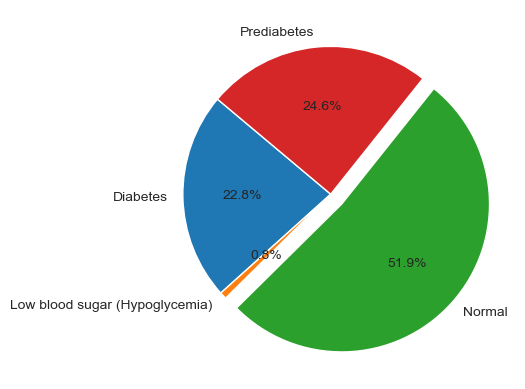

In [97]:
myexplode = [0, 0, 0.1, 0]
plt.pie(glucose_distribution['count of Patients'], labels = glucose_distribution['fasting_glucose'], explode = myexplode,
       autopct='%1.1f%%', startangle=140)
plt.show()

In [98]:
import plotly.graph_objects as go

# colors = ['#c74242',  '#3eed6c', '#ed7947', '#3e8aed', ]

fig = go.Figure(data=[go.Pie(
    labels=glucose_distribution['fasting_glucose'],
    values=glucose_distribution['count of Patients'],
    textinfo='percent+label',  # Display percentage and label
    pull=myexplode,  # Similar to explode in matplotlib
    hoverinfo='label+percent',  # Information displayed on hover
#     marker=dict(colors=colors)
)])

# Set the title and layout properties
fig.update_layout(
    title="Fasting Glucose Distribution",
    showlegend=True
)

# Show the plot
fig.show()

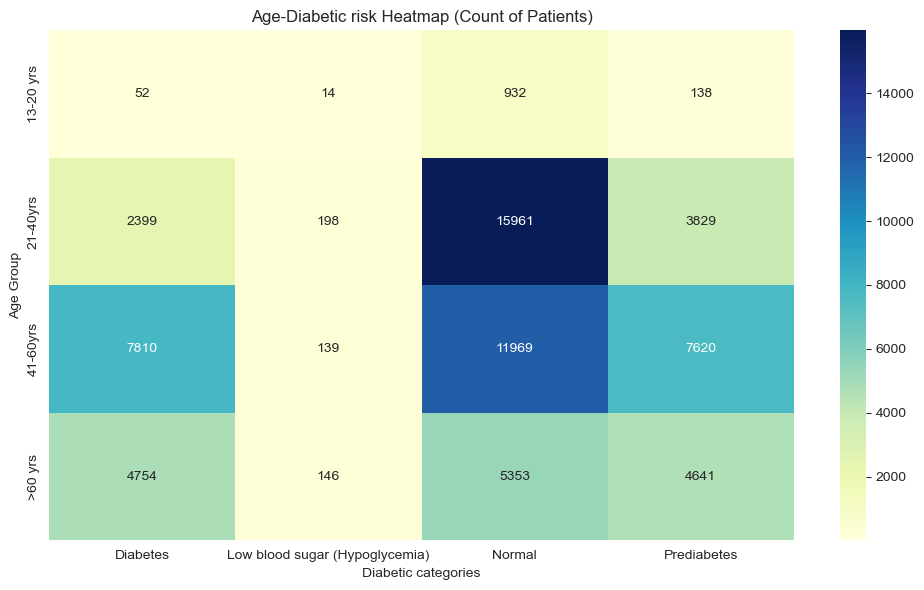

In [99]:
glucose_age = fasting_glucose.groupby(['age_group','fasting_glucose'])['document_id'].nunique().reset_index(name = 'count')
heatmap_data = glucose_age.pivot_table(index='age_group', columns='fasting_glucose', values='count', aggfunc='sum', fill_value=0)
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Age-Diabetic risk Heatmap (Count of Patients)')
plt.xlabel('Diabetic categories')
plt.ylabel('Age Group')
plt.tight_layout()
plt.show()

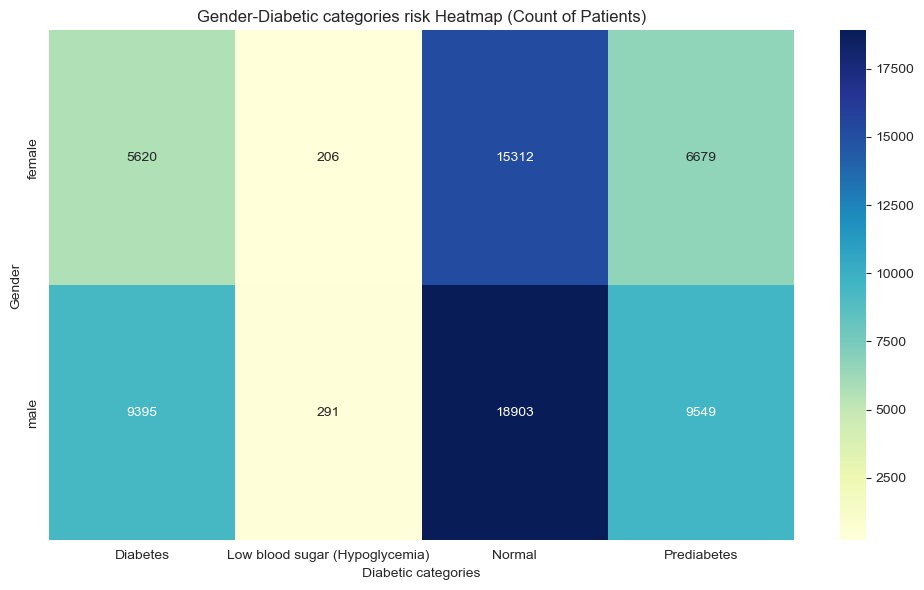

In [100]:
glucose_gender = fasting_glucose.groupby(['gender','fasting_glucose'])['document_id'].nunique().reset_index(name = 'count')
heatmap_data = glucose_gender.pivot_table(index='gender', columns='fasting_glucose', values='count', aggfunc='sum', fill_value=0)
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Gender-Diabetic categories risk Heatmap (Count of Patients)')
plt.xlabel('Diabetic categories')
plt.ylabel('Gender')
plt.tight_layout()
plt.show()

### Cluster Algorithm for cardiac risks

In [190]:
## Firstly find the max count risk for each document_id

data_ratio = data_ratio[data_ratio['value']<=10]
sorted_data = data_ratio.groupby(['document_id','age_group', 'gender', 'risk_factor']).size().reset_index(name = 'count').sort_values(['document_id','count'])




In [191]:
sorted_data

,document_id,age_group,gender,risk_factor,count
0,0000dc1043b556f847b88a34a1875b26,41-60yrs,female,Acceptable,1
1,0000dc1043b556f847b88a34a1875b26,41-60yrs,female,Ideal,1
2,000219ef567ad65827350691e2776022,21-40yrs,male,High Risk,1
3,000219ef567ad65827350691e2776022,21-40yrs,male,Ideal,2
4,0003b1d0154a792cf85a281ebd74c973,41-60yrs,female,Acceptable,1
...,...,...,...,...,...
128967,fffcb377ce41f9ab9fdee8e9cac404dd,21-40yrs,male,Acceptable,2
128968,fffe2fd97bbd873e06bdefdfe062d0f4,>60 yrs,male,High Risk,2
128969,ffff69772f903b1a7be9185ae6d56bde,41-60yrs,male,Ideal,2
128970,fffff93609ed68ea70215c36d645f82a,41-60yrs,male,Acceptable,1


In [192]:
risk_priority = {'High Risk': 0, 'Acceptable': 1, 'Ideal': 2}
sorted_data['priority'] = sorted_data['risk_factor'].map(risk_priority)

In [193]:
sorted_data = sorted_data.sort_values(by=['document_id', 'count', 'priority'], ascending=[True, False, True])

# Keep only the first occurrence (i.e., the highest count and highest priority) for each document_id
sorted_data = sorted_data.drop_duplicates(subset=['document_id'], keep='first')


In [194]:
sorted_data

,document_id,age_group,gender,risk_factor,count,priority
0,0000dc1043b556f847b88a34a1875b26,41-60yrs,female,Acceptable,1,1
3,000219ef567ad65827350691e2776022,21-40yrs,male,Ideal,2,2
4,0003b1d0154a792cf85a281ebd74c973,41-60yrs,female,Acceptable,1,1
6,0003e71385dbe6a18f0d08188075e45b,>60 yrs,male,Acceptable,3,1
8,000417c2d4a52c8f802b97d887802848,13-20 yrs,male,Ideal,3,2
...,...,...,...,...,...,...
128966,fffc224297d1aff06dbcfb80e79304d9,>60 yrs,female,Ideal,3,2
128967,fffcb377ce41f9ab9fdee8e9cac404dd,21-40yrs,male,Acceptable,2,1
128968,fffe2fd97bbd873e06bdefdfe062d0f4,>60 yrs,male,High Risk,2,0
128969,ffff69772f903b1a7be9185ae6d56bde,41-60yrs,male,Ideal,2,2


In [195]:
sorted_data = sorted_data.drop(columns = ['priority', 'count'])

In [196]:
sorted_data

,document_id,age_group,gender,risk_factor
0,0000dc1043b556f847b88a34a1875b26,41-60yrs,female,Acceptable
3,000219ef567ad65827350691e2776022,21-40yrs,male,Ideal
4,0003b1d0154a792cf85a281ebd74c973,41-60yrs,female,Acceptable
6,0003e71385dbe6a18f0d08188075e45b,>60 yrs,male,Acceptable
8,000417c2d4a52c8f802b97d887802848,13-20 yrs,male,Ideal
...,...,...,...,...
128966,fffc224297d1aff06dbcfb80e79304d9,>60 yrs,female,Ideal
128967,fffcb377ce41f9ab9fdee8e9cac404dd,21-40yrs,male,Acceptable
128968,fffe2fd97bbd873e06bdefdfe062d0f4,>60 yrs,male,High Risk
128969,ffff69772f903b1a7be9185ae6d56bde,41-60yrs,male,Ideal


In [197]:
sorted_data_fit = sorted_data.copy()

In [198]:
from kmodes.kmodes import KModes
import matplotlib.pyplot as plt
%matplotlib inline

In [199]:
sorted_data_fit.set_index('document_id', inplace=True)

In [200]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

In [201]:
sorted_data_fit['age_group'] = le.fit_transform(sorted_data_fit['age_group'])
sorted_data_fit['gender'] = le.fit_transform(sorted_data_fit['gender'])
sorted_data_fit['risk_factor'] = le.fit_transform(sorted_data_fit['risk_factor'])


In [202]:
sorted_data_fit

,age_group,gender,risk_factor
document_id,,,
0000dc1043b556f847b88a34a1875b26,2,0,0
000219ef567ad65827350691e2776022,1,1,2
0003b1d0154a792cf85a281ebd74c973,2,0,0
0003e71385dbe6a18f0d08188075e45b,3,1,0
000417c2d4a52c8f802b97d887802848,0,1,2
...,...,...,...
fffc224297d1aff06dbcfb80e79304d9,3,0,2
fffcb377ce41f9ab9fdee8e9cac404dd,1,1,0
fffe2fd97bbd873e06bdefdfe062d0f4,3,1,1


Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 141584.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 141584.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 141584.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 141584.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 141584.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 108371.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 100836.0
Init: initializing centroids
Init: initializing clusters
Starting it

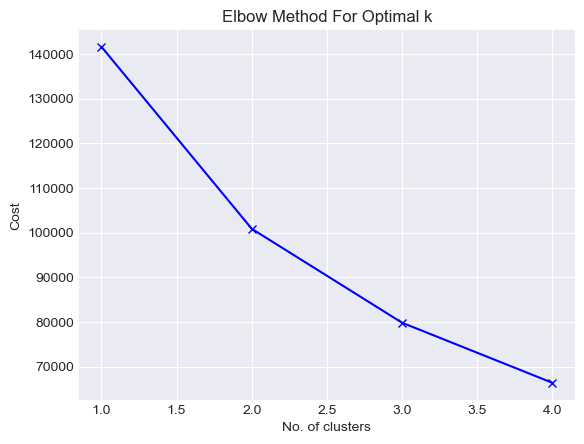

In [203]:
## Creating and elbow plot to find the number of clusters

# Elbow curve to find optimal K
cost = []
K = range(1,5)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(sorted_data_fit)
    cost.append(kmode.cost_)
    
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

In [204]:
import random
import numpy as np


random.seed(9)
np.random.seed(9)

kmode = KModes(n_clusters=3, init = "random", n_init = 5, verbose=1)
clusters = kmode.fit_predict(sorted_data_fit)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 2683, cost: 96008.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 7975, cost: 80352.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 90401.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 25154, cost: 82332.0
Run 4, iteration: 2/100, moves: 0, cost: 82332.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 17437, cost: 81859.0
Run 5, iteration: 2/100, moves: 4884, cost: 81859.0
Best run was number 2


In [205]:
sorted_data_fit['cluster'] = clusters

In [206]:
sorted_data_fit

,age_group,gender,risk_factor,cluster
document_id,,,,
0000dc1043b556f847b88a34a1875b26,2,0,0,0
000219ef567ad65827350691e2776022,1,1,2,1
0003b1d0154a792cf85a281ebd74c973,2,0,0,0
0003e71385dbe6a18f0d08188075e45b,3,1,0,1
000417c2d4a52c8f802b97d887802848,0,1,2,2
...,...,...,...,...
fffc224297d1aff06dbcfb80e79304d9,3,0,2,0
fffcb377ce41f9ab9fdee8e9cac404dd,1,1,0,1
fffe2fd97bbd873e06bdefdfe062d0f4,3,1,1,1


In [207]:
sorted_data['clusters'] = clusters
sorted_data

,document_id,age_group,gender,risk_factor,clusters
0,0000dc1043b556f847b88a34a1875b26,41-60yrs,female,Acceptable,0
3,000219ef567ad65827350691e2776022,21-40yrs,male,Ideal,1
4,0003b1d0154a792cf85a281ebd74c973,41-60yrs,female,Acceptable,0
6,0003e71385dbe6a18f0d08188075e45b,>60 yrs,male,Acceptable,1
8,000417c2d4a52c8f802b97d887802848,13-20 yrs,male,Ideal,2
...,...,...,...,...,...
128966,fffc224297d1aff06dbcfb80e79304d9,>60 yrs,female,Ideal,0
128967,fffcb377ce41f9ab9fdee8e9cac404dd,21-40yrs,male,Acceptable,1
128968,fffe2fd97bbd873e06bdefdfe062d0f4,>60 yrs,male,High Risk,1
128969,ffff69772f903b1a7be9185ae6d56bde,41-60yrs,male,Ideal,2


In [209]:
sorted_data[sorted_data['clusters']==0]['age_group'].value_counts()

age_group
41-60yrs     16673
>60 yrs       8356
21-40yrs      7241
13-20 yrs      805
Name: count, dtype: int64

In [210]:
df[df['value'].isna()]

,age,gender,risk_factor,value,loinc


In [225]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Load your DataFrame
df = data_ratio[['document_id','age', 'gender', 'risk_factor', 'value', 'loinc']]
df = df[~df['value'].isna()]

# Step 1: Group by LOINC
for loinc_code, group in df.groupby('loinc'):
    # Step 2: Encode gender
    group['gender'] = group['gender'].map({'female': 0, 'male': 1})
    
    # Step 3: Select features
    X = group[['age', 'gender', 'value']]
    
    # Step 4: Scale and cluster
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    kmeans = KMeans(n_clusters=3, random_state=42)
    group['cluster'] = kmeans.fit_predict(X_scaled)
    
    # Step 5: Analyze results
    print(f"Results for LOINC {loinc_code}")
    print(group[['document_id','value', 'age', 'gender', 'cluster', 'risk_factor']])
    print("\n\n")


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Results for LOINC 11054-4
                              document_id  value  age  gender  cluster  \
15       a1ce7f03fca11a7351927f5d6d635552   0.90   72       0        0   
96       7cb374e4e2b825c5af8206157026b16f   3.64   40       1        2   
164      fb1e52cde47cc795f457196c6ffaa52b   2.81   55       1        1   
279      75f7a1c823a5229c96cd3eb0d717f059   2.50   55       0        0   
345      518edc22415cb7ef8b9fd1a037245208   1.00   78       0        0   
...                                   ...    ...  ...     ...      ...   
6844108  56c45da1c71432cda5b03373d1fa68a0   1.99   19       0        0   
6844131  882dce41002e6720456f3e72e5d0029b   1.80   18       0        0   
6844188  61da6e85a186a13bcad87f6d3b67e8cd   4.27   59       1        2   
6844234  8a35f22799da3e136e6bf908b880d627   3.16   43       0        0   
6844276  2f559a8f449f646825c469bb2c0b4f40   3.58   33       1        2   

        risk_factor  
15            Ideal  
96        High Risk  
164      Acceptable

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Results for LOINC 16616-5
                              document_id  value  age  gender  cluster  \
162      fb1e52cde47cc795f457196c6ffaa52b   0.36   55       1        0   
277      75f7a1c823a5229c96cd3eb0d717f059   0.39   55       0        1   
1230     bfa135d429371a608980be756fc0aecc   0.39   39       1        2   
1703     2da3d1c1112f3ff470cc3a12c4e020ac   0.30   53       1        2   
1841     3148b26dd8bde4bc04382bd498b6e1ef   0.24   34       1        2   
...                                   ...    ...  ...     ...      ...   
6843189  074f31447ecd1d2d59c199b9920119d6   0.30   52       0        1   
6843373  b8eaa33cedc632a90795730a428c4440   0.44   53       0        1   
6843615  2b8402730878944654009458713aa480   0.40   71       1        0   
6843694  50017265a1b5af3e3aadd25730122ae6   0.76   28       0        1   
6843949  7fbd7364dc1fb25f56aa1639a8917a5f   0.27   32       1        2   

        risk_factor  
162       High Risk  
277       High Risk  
1230      High Risk

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Results for LOINC 44733-4
                              document_id  value  age  gender  cluster  \
101      7cb374e4e2b825c5af8206157026b16f   2.73   40       1        2   
284      75f7a1c823a5229c96cd3eb0d717f059   2.44   55       0        0   
508      2d718c5af570c6eb62270e6aec3810ef   9.75   55       1        1   
637      6d877d1e8d5c88e5acd7d56845bae500   2.56   50       0        0   
977      803f5fd43b186391ee3fd98dcb55ca9f   4.10   49       1        2   
...                                   ...    ...  ...     ...      ...   
6843450  c454974e49a2c664c42eef4d8897de4a   3.53   66       1        2   
6843701  50017265a1b5af3e3aadd25730122ae6   0.88   28       0        0   
6843808  403e25f347dff996371b83708541a23e   1.63   75       0        0   
6843956  7fbd7364dc1fb25f56aa1639a8917a5f   3.65   32       1        2   
6844113  56c45da1c71432cda5b03373d1fa68a0   0.96   19       0        0   

        risk_factor  
101      Acceptable  
284      Acceptable  
508       High Risk

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Results for LOINC 9830-1
                              document_id  value  age  gender  cluster  \
18       a1ce7f03fca11a7351927f5d6d635552   2.40   72       0        1   
94       7cb374e4e2b825c5af8206157026b16f   5.16   40       1        0   
160      fb1e52cde47cc795f457196c6ffaa52b   4.55   55       1        2   
282      75f7a1c823a5229c96cd3eb0d717f059   3.70   55       0        1   
342      518edc22415cb7ef8b9fd1a037245208   3.12   78       0        1   
...                                   ...    ...  ...     ...      ...   
6844105  56c45da1c71432cda5b03373d1fa68a0   3.52   19       0        1   
6844133  882dce41002e6720456f3e72e5d0029b   3.27   18       0        1   
6844205  61da6e85a186a13bcad87f6d3b67e8cd   6.16   59       1        0   
6844230  8a35f22799da3e136e6bf908b880d627   5.12   43       0        1   
6844272  2f559a8f449f646825c469bb2c0b4f40   5.50   33       1        0   

        risk_factor  
18            Ideal  
94        High Risk  
160      Acceptable 

In [222]:
data_ratio['loinc'].unique()

array(['11054-4', '9830-1', '44733-4', '16616-5'], dtype=object)

In [212]:
group[group['cluster']==2]['value'].value_counts()

value
4.000    477
3.500    444
3.300    444
3.000    408
3.400    405
        ... 
6.820      1
1.580      1
3.241      1
5.820      1
3.192      1
Name: count, Length: 627, dtype: int64

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



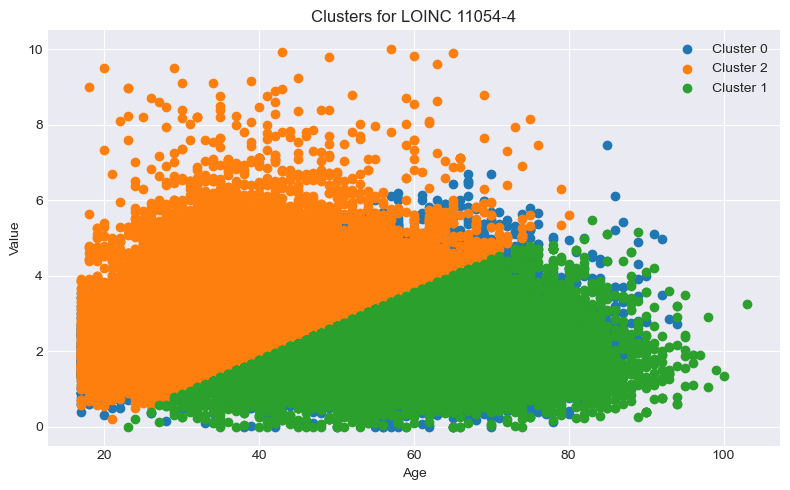

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



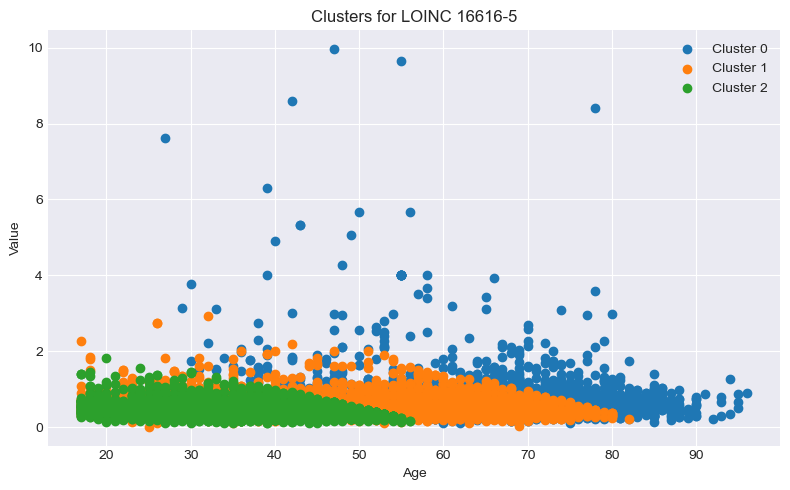

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



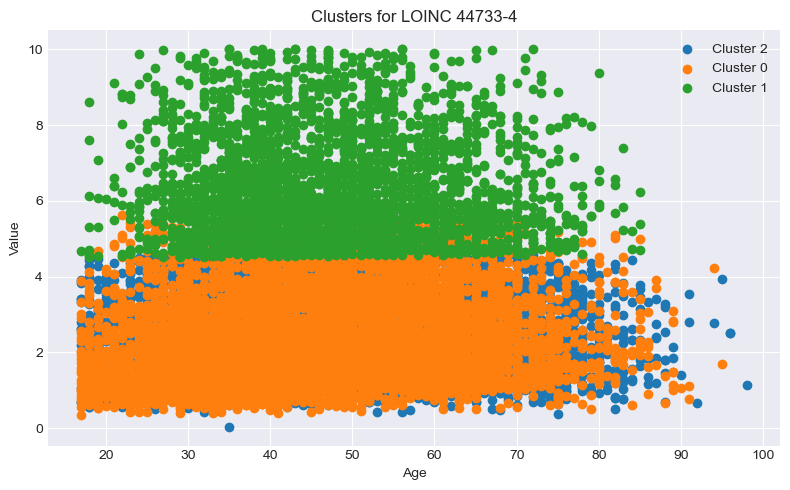

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



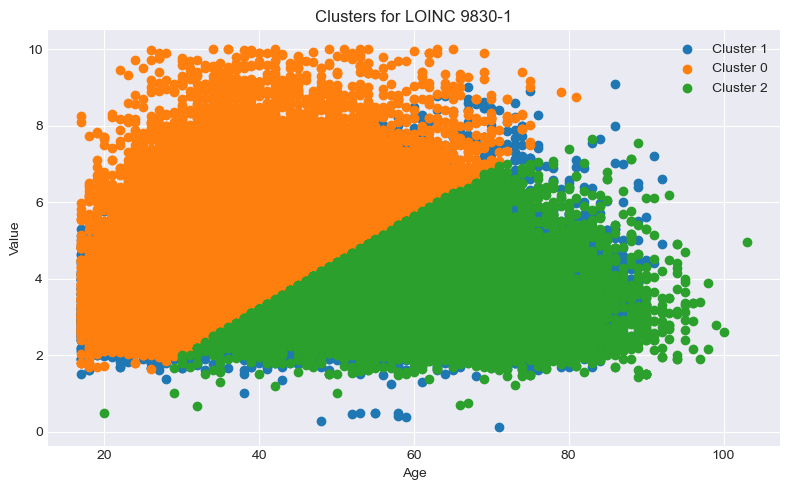

In [217]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Optional: Set figure style
plt.style.use('seaborn-v0_8-darkgrid')

df = data_ratio[['document_id','age', 'gender', 'risk_factor', 'value', 'loinc']]
df = df[~df['value'].isna()]

# Loop over each LOINC group
for loinc_code, group in df.groupby('loinc'):
    group = group.copy()
    
    # Encode gender
    group['gender'] = group['gender'].map({'female': 0, 'male': 1})
    
#     # Drop NaNs
#     group = group.dropna(subset=['age', 'gender', 'value'])
    
    if len(group) < 3:
        print(f"Skipping LOINC {loinc_code} (too few samples)")
        continue

    # Prepare features
    X = group[['age', 'gender', 'value']]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # KMeans clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    group['cluster'] = kmeans.fit_predict(X_scaled)
    
    # Plot
    plt.figure(figsize=(8, 5))
    for cluster_id in group['cluster'].unique():
        cluster_data = group[group['cluster'] == cluster_id]
        plt.scatter(cluster_data['age'], cluster_data['value'], label=f"Cluster {cluster_id}")

    plt.title(f"Clusters for LOINC {loinc_code}")
    plt.xlabel("Age")
    plt.ylabel("Value")
    plt.legend()
    plt.tight_layout()
    plt.show()


/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



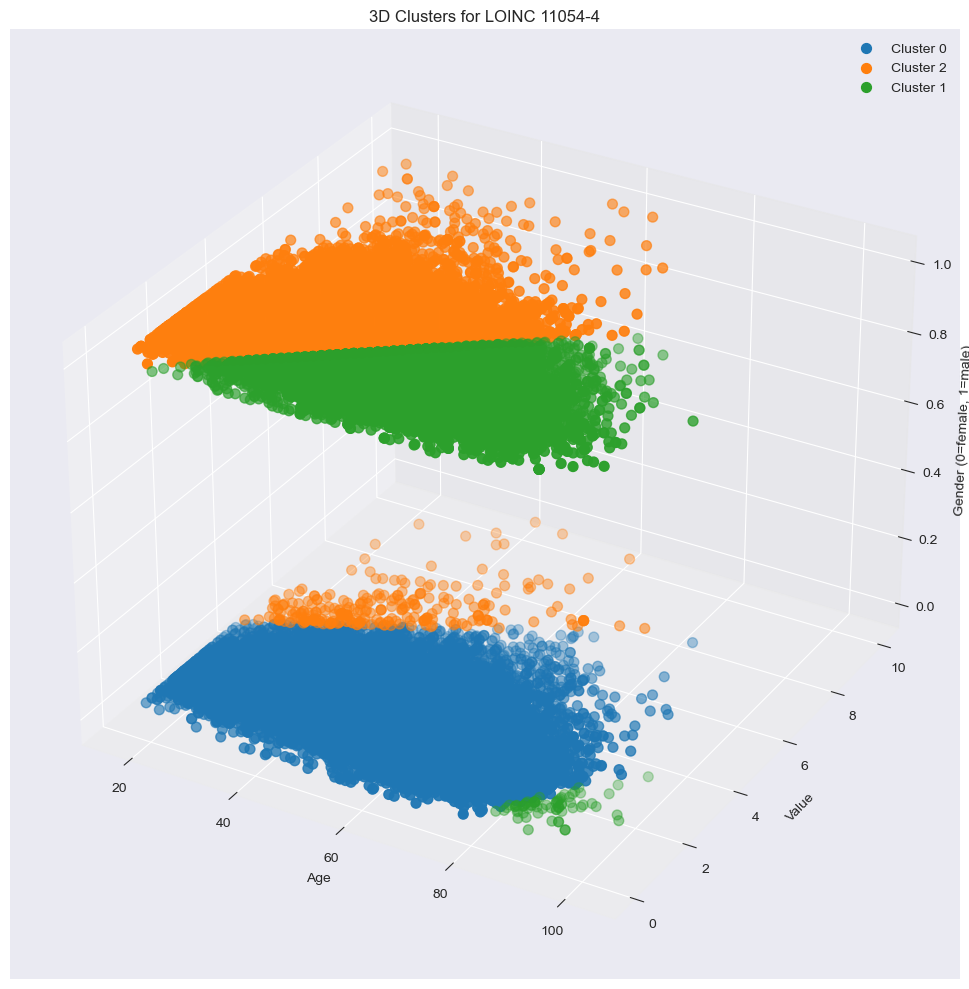

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



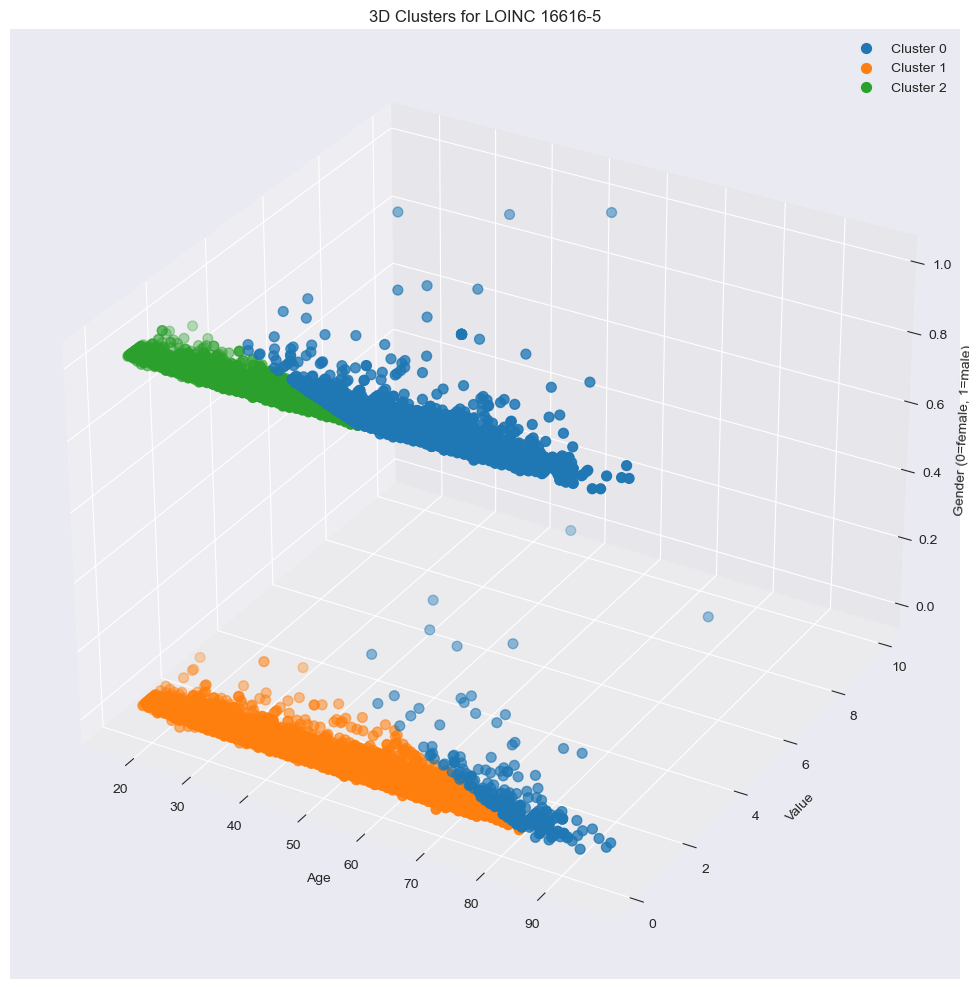

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



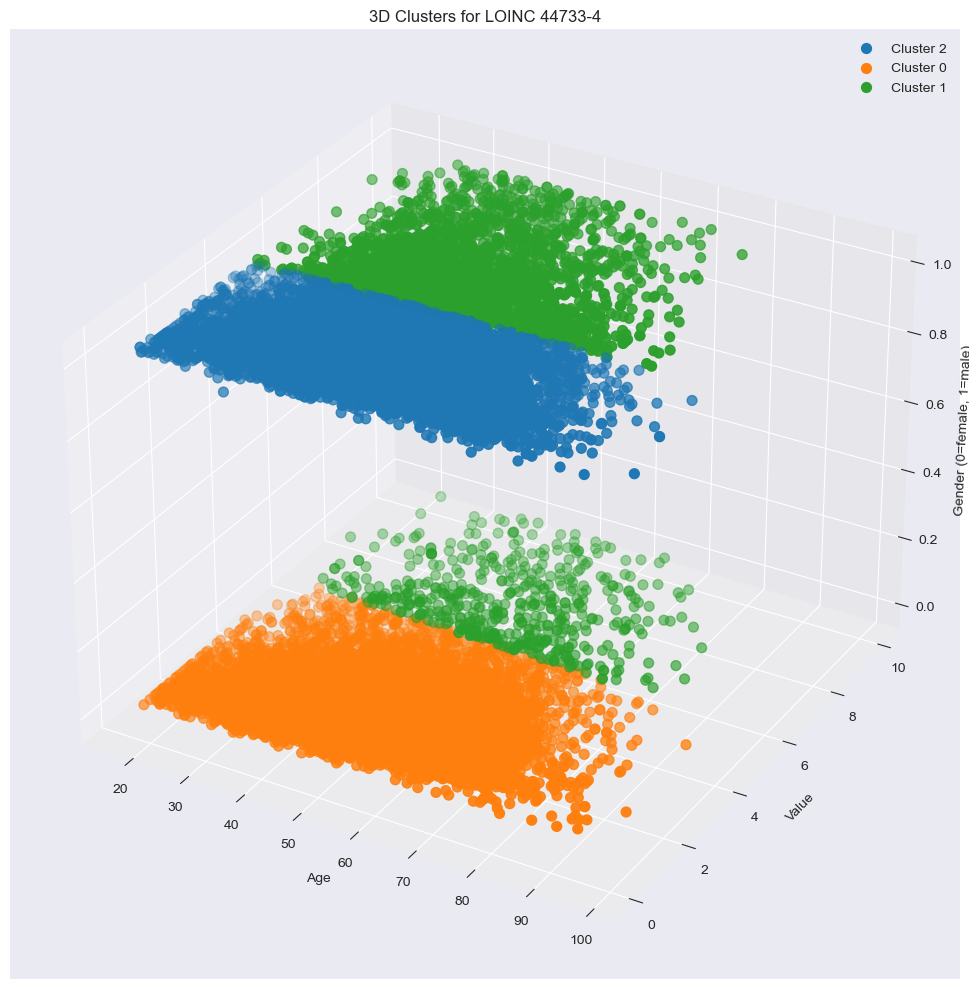

/Users/sangeetasaha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



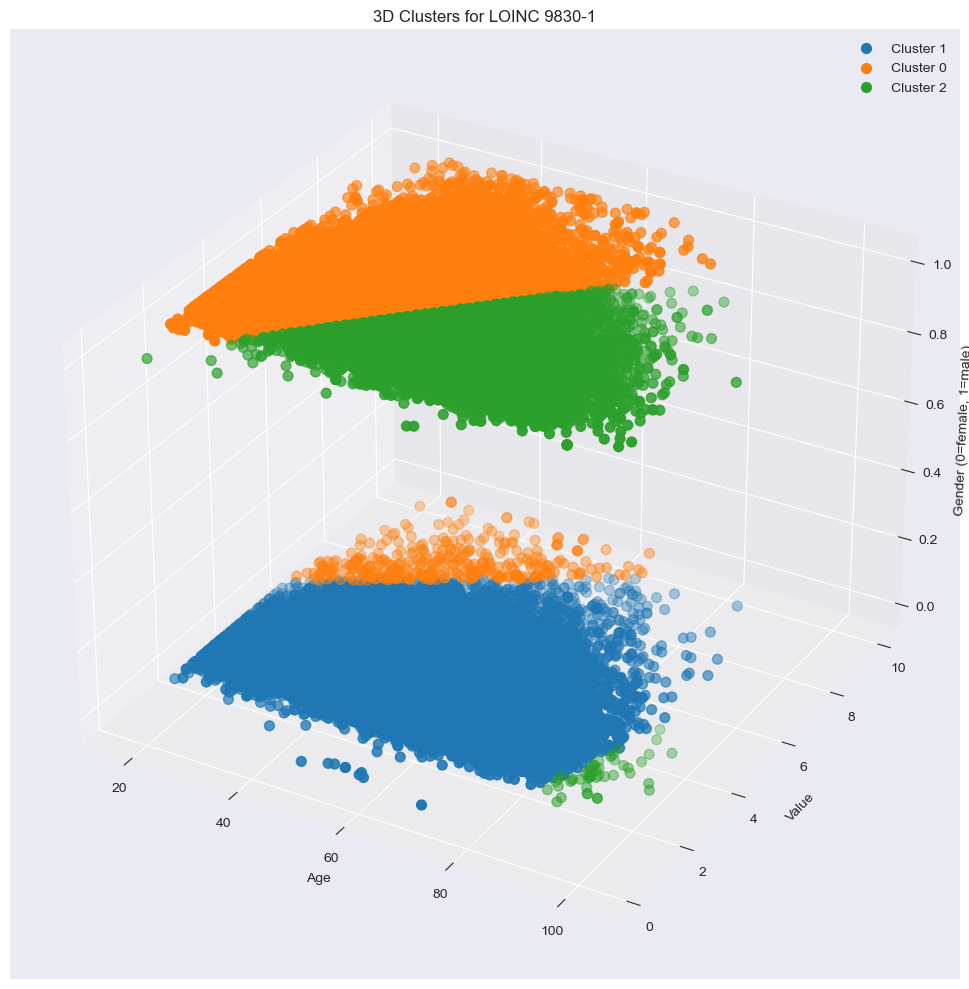

In [219]:
from mpl_toolkits.mplot3d import Axes3D  # Needed for 3D plots

# Optional: set style again for clarity
plt.style.use('seaborn-v0_8-darkgrid')

df = data_ratio[['document_id','age', 'gender', 'risk_factor', 'value', 'loinc']]
df = df[~df['value'].isna()]

# Loop over each LOINC group
for loinc_code, group in df.groupby('loinc'):
    group = group.copy()

    # Encode gender
    group['gender'] = group['gender'].map({'female': 0, 'male': 1})

    if len(group) < 3:
        print(f"Skipping LOINC {loinc_code} (too few samples)")
        continue

    # Prepare features
    X = group[['age', 'gender', 'value']]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # KMeans clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    group['cluster'] = kmeans.fit_predict(X_scaled)

    # 3D Plot
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    for cluster_id in group['cluster'].unique():
        cluster_data = group[group['cluster'] == cluster_id]
        ax.scatter(
            cluster_data['age'], 
            cluster_data['value'], 
            cluster_data['gender'], 
            label=f"Cluster {cluster_id}", 
            s=50
        )

    ax.set_title(f"3D Clusters for LOINC {loinc_code}")
    ax.set_xlabel("Age")
    ax.set_ylabel("Value")
    ax.set_zlabel("Gender (0=female, 1=male)")
    ax.legend()
    plt.tight_layout()
    plt.show()


In [14]:
cardiovascular_health_loinc_codes = [
    '2085-9',  # Cholesterol, Total [Mass/Volume] in Serum or Plasma
    '2089-1',  # Cholesterol, HDL [Mass/Volume] in Serum or Plasma
    '2093-3',  # Cholesterol, LDL [Mass/Volume] in Serum or Plasma
    '43396-1',  # Triglycerides [Mass/Volume] in Serum or Plasma
    '2106-3',  # Apolipoprotein B [Mass/Volume] in Serum or Plasma
    '3026-2',  # Creatine Kinase [Enzymatic Activity/Volume] in Serum or Plasma
    '3016-3',  # Troponin T [Mass/Volume] in Serum or Plasma
    '32207-3',  # B-Type Natriuretic Peptide (BNP) [Mass/Volume] in Serum or Plasma
    '33903-6',  # High-Sensitivity C-Reactive Protein (hs-CRP) [Mass/Volume] in Serum or Plasma
    '3053-6',  # Natriuretic Peptide (Brain Type) [Mass/Volume] in Serum or Plasma
    '2567-5',  # Hemoglobin A1c [Mass/Volume] in Blood
    '69405-9'   # Cardiac Risk Score (Framingham)
]


In [26]:
d = data[data['test_name'].str.contains('cholesterol', case=False, na=False)]

In [41]:
dataset

Dataset({
    features: ['document_id', 'age', 'gender', 'test_name', 'display_ranges', 'value', 'unit', 'specimen', 'loinc'],
    num_rows: 6844304
})